# Face Generation
In this project, you'll use generative adversarial networks to generate new images of faces.
### Get the Data
You'll be using two datasets in this project:
- MNIST
- CelebA

Since the celebA dataset is complex and you're doing GANs in a project for the first time, we want you to test your neural network on MNIST before CelebA.  Running the GANs on MNIST will allow you to see how well your model trains sooner.

If you're using [FloydHub](https://www.floydhub.com/), set `data_dir` to "/input" and use the [FloydHub data ID](http://docs.floydhub.com/home/using_datasets/) "R5KrjnANiKVhLWAkpXhNBe".

In [1]:
data_dir = './data'

# FloydHub - Use with data ID "R5KrjnANiKVhLWAkpXhNBe"
#data_dir = '/input'


"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import helper

helper.download_extract('mnist', data_dir)
helper.download_extract('celeba', data_dir)

Found mnist Data
Found celeba Data


## Explore the Data
### MNIST
As you're aware, the [MNIST](http://yann.lecun.com/exdb/mnist/) dataset contains images of handwritten digits. You can view the first number of examples by changing `show_n_images`. 

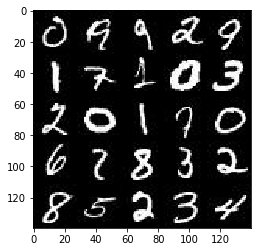

In [2]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot

mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'mnist/*.jpg'))[:show_n_images], 28, 28, 'L')
pyplot.imshow(helper.images_square_grid(mnist_images, 'L'), cmap='gray')

### CelebA
The [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations.  Since you're going to be generating faces, you won't need the annotations.  You can view the first number of examples by changing `show_n_images`.

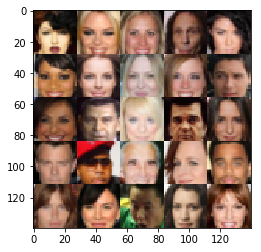

In [3]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:show_n_images], 28, 28, 'RGB')
pyplot.imshow(helper.images_square_grid(mnist_images, 'RGB'))

## Preprocess the Data
Since the project's main focus is on building the GANs, we'll preprocess the data for you.  The values of the MNIST and CelebA dataset will be in the range of -0.5 to 0.5 of 28x28 dimensional images.  The CelebA images will be cropped to remove parts of the image that don't include a face, then resized down to 28x28.

The MNIST images are black and white images with a single [color channel](https://en.wikipedia.org/wiki/Channel_(digital_image%29) while the CelebA images have [3 color channels (RGB color channel)](https://en.wikipedia.org/wiki/Channel_(digital_image%29#RGB_Images).
## Build the Neural Network
You'll build the components necessary to build a GANs by implementing the following functions below:
- `model_inputs`
- `discriminator`
- `generator`
- `model_loss`
- `model_opt`
- `train`

### Check the Version of TensorFlow and Access to GPU
This will check to make sure you have the correct version of TensorFlow and access to a GPU

In [4]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
from distutils.version import LooseVersion
import warnings
import tensorflow as tf

# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

TensorFlow Version: 1.0.0
Default GPU Device: /gpu:0


### Input
Implement the `model_inputs` function to create TF Placeholders for the Neural Network. It should create the following placeholders:
- Real input images placeholder with rank 4 using `image_width`, `image_height`, and `image_channels`.
- Z input placeholder with rank 2 using `z_dim`.
- Learning rate placeholder with rank 0.

Return the placeholders in the following the tuple (tensor of real input images, tensor of z data)

In [38]:
import problem_unittests as tests

def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width
    :param image_height: The input image height
    :param image_channels: The number of image channels
    :param z_dim: The dimension of Z
    :return: Tuple of (tensor of real input images, tensor of z data, learning rate)
    """
    # TODO: Implement Function
    input_real = tf.placeholder(tf.float32, (None, image_width, image_height, image_channels), name='input_real')
    input_z = tf.placeholder(tf.float32, (None, z_dim), name='input_z')
    learning_rate = tf.placeholder(tf.float32, name='learn_rate')
    return input_real, input_z, learning_rate


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_inputs(model_inputs)

Tests Passed


### Discriminator
Implement `discriminator` to create a discriminator neural network that discriminates on `images`.  This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "discriminator" to allow the variables to be reused.  The function should return a tuple of (tensor output of the discriminator, tensor logits of the discriminator).

In [39]:
def discriminator(images, reuse=False):
    """
    Create the discriminator network
    :param images: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """
    # TODO: Implement Function
    with tf.variable_scope('discriminator', reuse=reuse):
        # Input layer is 32x32x3
        alpha = 0.2
        
        x1 = tf.layers.conv2d(images, 64, 5, strides=2, padding='same')
        relu1 = tf.maximum(alpha * x1, x1)
        # 16x16x64

        x2 = tf.layers.conv2d(relu1, 128, 5, strides=2, padding='same')
        bn2 = tf.layers.batch_normalization(x2, training=True)
        relu2 = tf.maximum(alpha * bn2, bn2)
        # 8x8x128

        x3 = tf.layers.conv2d(relu2, 256, 5, strides=2, padding='same')
        bn3 = tf.layers.batch_normalization(x3, training=True)
        relu3 = tf.maximum(alpha * bn3, bn3)
        # 4x4x256

        # Flatten it
        flat = tf.reshape(relu3, (-1, 4*4*256))
        logits = tf.layers.dense(flat, 1)
        out = tf.sigmoid(logits)

        return out, logits


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_discriminator(discriminator, tf)

Tests Passed


### Generator
Implement `generator` to generate an image using `z`. This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "generator" to allow the variables to be reused. The function should return the generated 28 x 28 x `out_channel_dim` images.

In [40]:
def generator(z, out_channel_dim, is_train=True):
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    :return: The tensor output of the generator
    """
    # TODO: Implement Function
    
    with tf.variable_scope('generator', reuse=not is_train):
        
        alpha = 0.2
        
        # First fully connected layer
        x1 = tf.layers.dense(z, 3*3*512)
        # Reshape it to start the convolutional stack
        x1 = tf.reshape(x1, (-1, 3, 3, 512))
        x1 = tf.layers.batch_normalization(x1, training=is_train)
        x1 = tf.maximum(alpha * x1, x1)
        # 3x3x512 now
        
        x2 = tf.layers.conv2d_transpose(x1, 256, 2, strides=2, padding='valid')
        x2 = tf.layers.batch_normalization(x2, training=is_train)
        x2 = tf.maximum(alpha * x2, x2)
        # 6x6x256 now
                     
        x3 = tf.layers.conv2d_transpose(x2, 128, 3, strides=2, padding='valid')
        x3 = tf.layers.batch_normalization(x3, training=is_train)
        x3 = tf.maximum(alpha * x3, x3)
        
        # Output layer
        logits = tf.layers.conv2d_transpose(x3, out_channel_dim, 4, strides=2, padding='valid')
        # 28x28xoutdim now
        
        out = tf.tanh(logits)
        
#         print(x1)
#         print(x2)
#         print(logits)
        
        return out


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_generator(generator, tf)

Tests Passed


### Loss
Implement `model_loss` to build the GANs for training and calculate the loss.  The function should return a tuple of (discriminator loss, generator loss).  Use the following functions you implemented:
- `discriminator(images, reuse=False)`
- `generator(z, out_channel_dim, is_train=True)`

In [41]:
def model_loss(input_real, input_z, out_channel_dim):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    # TODO: Implement Function
    g_model = generator(input_z, out_channel_dim)
    d_model_real, d_logits_real = discriminator(input_real)
    d_model_fake, d_logits_fake = discriminator(g_model, reuse=True)

    d_loss_real = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real, labels=tf.ones_like(d_model_real)))
    d_loss_fake = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.zeros_like(d_model_fake)))
    g_loss = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.ones_like(d_model_fake)))

    d_loss = d_loss_real + d_loss_fake

    return d_loss, g_loss


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_loss(model_loss)

Tests Passed


### Optimization
Implement `model_opt` to create the optimization operations for the GANs. Use [`tf.trainable_variables`](https://www.tensorflow.org/api_docs/python/tf/trainable_variables) to get all the trainable variables.  Filter the variables with names that are in the discriminator and generator scope names.  The function should return a tuple of (discriminator training operation, generator training operation).

In [42]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # TODO: Implement Function
    
    t_vars = tf.trainable_variables()
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]
    g_vars = [var for var in t_vars if var.name.startswith('generator')]

    # Optimize
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        d_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(d_loss, var_list=d_vars)
        g_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(g_loss, var_list=g_vars)

    return d_train_opt, g_train_opt


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_opt(model_opt, tf)

Tests Passed


## Neural Network Training
### Show Output
Use this function to show the current output of the generator during training. It will help you determine how well the GANs is training.

In [43]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import numpy as np

def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode):
    """
    Show example output for the generator
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z})

    images_grid = helper.images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()

### Train
Implement `train` to build and train the GANs.  Use the following functions you implemented:
- `model_inputs(image_width, image_height, image_channels, z_dim)`
- `model_loss(input_real, input_z, out_channel_dim)`
- `model_opt(d_loss, g_loss, learning_rate, beta1)`

Use the `show_generator_output` to show `generator` output while you train. Running `show_generator_output` for every batch will drastically increase training time and increase the size of the notebook.  It's recommended to print the `generator` output every 100 batches.

In [50]:
def train(epoch_count, batch_size, z_dim, learning_rate, beta1, get_batches, data_shape, data_image_mode):
    """
    Train the GAN
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """
    # TODO: Build Model
    
    losses = []
    steps = 0
    _,image_width, image_height, image_channels = data_shape
    # Keep in mind that the learning_rate_pl is the dictionary key for the scalar learning_rate value
    input_real, input_z , learning_rate_pl = model_inputs(image_width,image_height,image_channels,z_dim)
    
    d_loss, g_loss = model_loss(input_real, input_z, image_channels)
    d_opt, g_opt = model_opt(d_loss, g_loss,learning_rate_pl, beta1)
    n_images = 25
    
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for epoch_i in range(epoch_count):
            for batch_images in get_batches(batch_size):
                # TODO: Train Model
                image_input = 2 * batch_images #Scale images from abs(0.5) to 1
                steps +=1
                
                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_dim))
                
                # Run optimizers
                _ = sess.run(d_opt, feed_dict={input_real: image_input, input_z: batch_z, learning_rate_pl: learning_rate})
                
                _ = sess.run(g_opt, feed_dict={input_real: image_input, input_z: batch_z, learning_rate_pl: learning_rate})
                
                if steps % 10 == 0:
                    n_images = 9
                    # At the end of each epoch, get the losses and print them out
                    train_loss_d = sess.run(d_loss, feed_dict={input_z: batch_z, input_real: image_input, learning_rate_pl: learning_rate })
                    train_loss_g = g_loss.eval({input_z: batch_z})

                    print("Epoch {}/{}...".format(epoch_i+1, epochs),
                          "Discriminator Loss: {:.4f}...".format(train_loss_d),
                          "Generator Loss: {:.4f}".format(train_loss_g))

                    show_generator_output(sess, n_images, input_z, image_channels, data_image_mode)
                

### MNIST
Test your GANs architecture on MNIST.  After 2 epochs, the GANs should be able to generate images that look like handwritten digits.  Make sure the loss of the generator is lower than the loss of the discriminator or close to 0.

Epoch 1/2... Discriminator Loss: 0.6904... Generator Loss: 10.6313


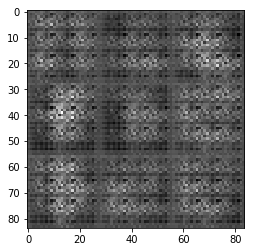

Epoch 1/2... Discriminator Loss: 0.2735... Generator Loss: 2.6753


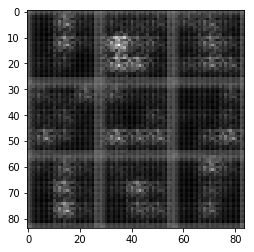

Epoch 1/2... Discriminator Loss: 1.4376... Generator Loss: 0.5022


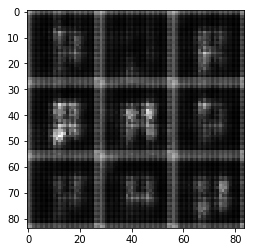

Epoch 1/2... Discriminator Loss: 2.0942... Generator Loss: 0.2641


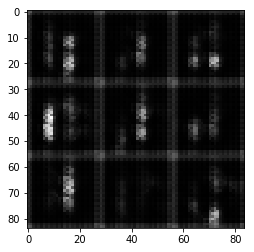

Epoch 1/2... Discriminator Loss: 1.5635... Generator Loss: 2.6267


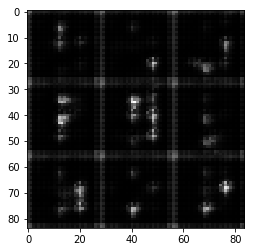

Epoch 1/2... Discriminator Loss: 0.9856... Generator Loss: 1.4696


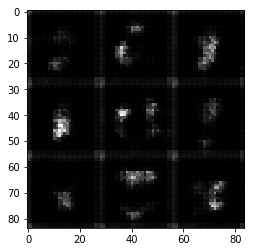

Epoch 1/2... Discriminator Loss: 1.2415... Generator Loss: 2.4441


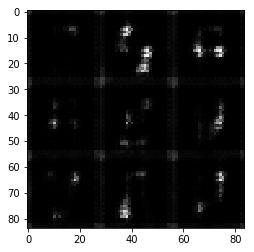

Epoch 1/2... Discriminator Loss: 1.5414... Generator Loss: 3.0573


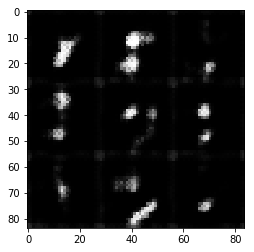

Epoch 1/2... Discriminator Loss: 2.0958... Generator Loss: 0.2491


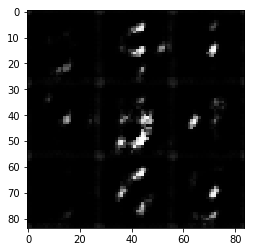

Epoch 1/2... Discriminator Loss: 1.6393... Generator Loss: 2.6984


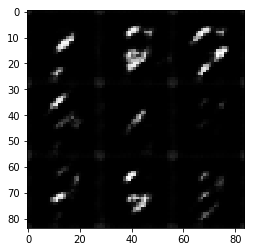

Epoch 1/2... Discriminator Loss: 1.5486... Generator Loss: 0.4561


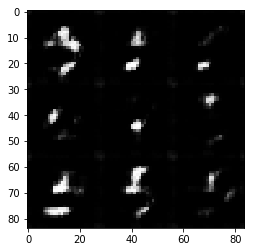

Epoch 1/2... Discriminator Loss: 1.0721... Generator Loss: 0.9572


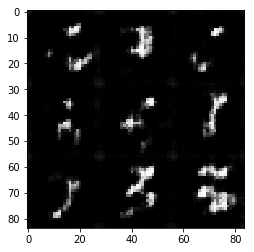

Epoch 1/2... Discriminator Loss: 1.0103... Generator Loss: 0.7501


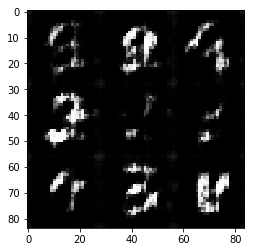

Epoch 1/2... Discriminator Loss: 1.2963... Generator Loss: 1.0509


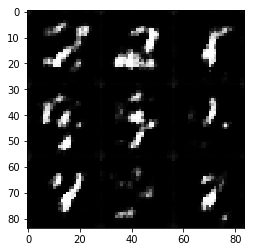

Epoch 1/2... Discriminator Loss: 1.0750... Generator Loss: 0.8146


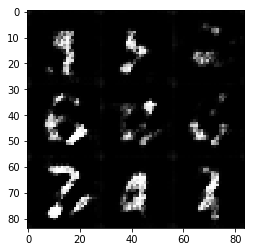

Epoch 1/2... Discriminator Loss: 1.5836... Generator Loss: 1.9521


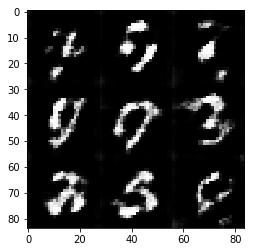

Epoch 1/2... Discriminator Loss: 1.5892... Generator Loss: 2.8324


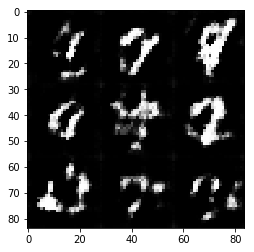

Epoch 1/2... Discriminator Loss: 1.4933... Generator Loss: 2.1733


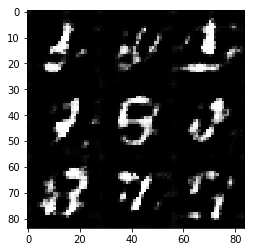

Epoch 1/2... Discriminator Loss: 1.4001... Generator Loss: 0.5031


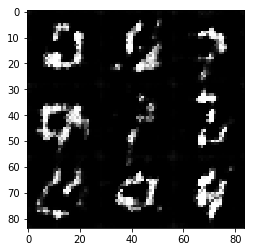

Epoch 1/2... Discriminator Loss: 1.4471... Generator Loss: 1.6279


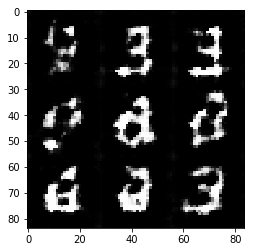

Epoch 1/2... Discriminator Loss: 1.4669... Generator Loss: 0.4861


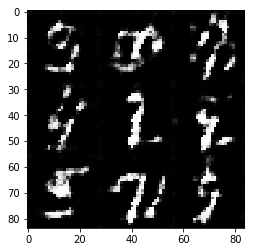

Epoch 1/2... Discriminator Loss: 0.6888... Generator Loss: 1.1407


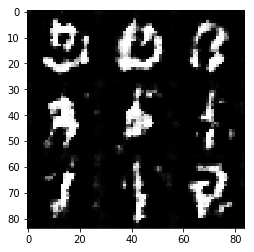

Epoch 1/2... Discriminator Loss: 1.1692... Generator Loss: 2.3299


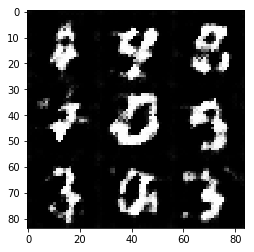

Epoch 1/2... Discriminator Loss: 1.2934... Generator Loss: 0.6978


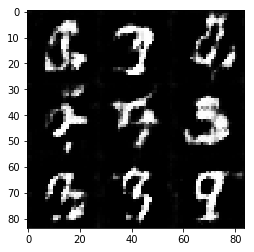

Epoch 1/2... Discriminator Loss: 1.3081... Generator Loss: 0.6619


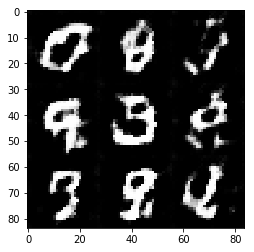

Epoch 1/2... Discriminator Loss: 0.8179... Generator Loss: 1.3668


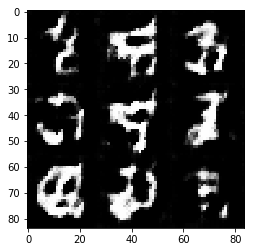

Epoch 1/2... Discriminator Loss: 1.6345... Generator Loss: 0.3007


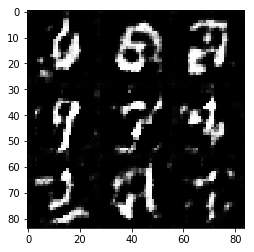

Epoch 1/2... Discriminator Loss: 1.1911... Generator Loss: 0.7069


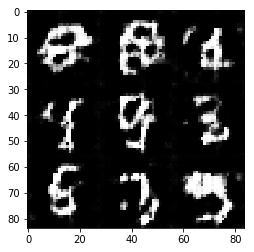

Epoch 1/2... Discriminator Loss: 0.9659... Generator Loss: 0.9885


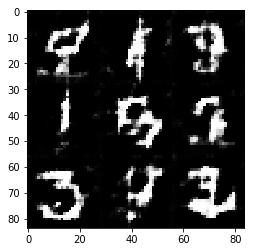

Epoch 1/2... Discriminator Loss: 1.7603... Generator Loss: 0.2524


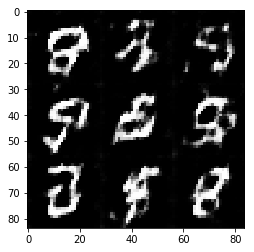

Epoch 1/2... Discriminator Loss: 0.9933... Generator Loss: 2.4200


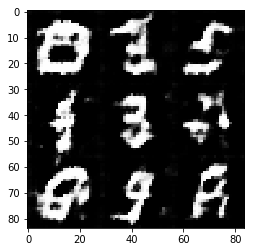

Epoch 1/2... Discriminator Loss: 1.0290... Generator Loss: 1.0371


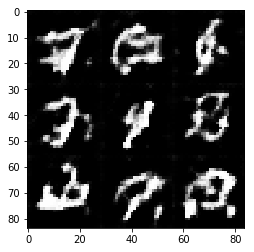

Epoch 1/2... Discriminator Loss: 0.8656... Generator Loss: 1.4220


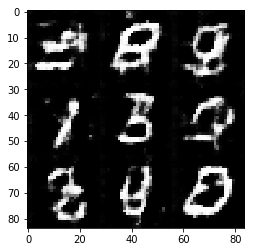

Epoch 1/2... Discriminator Loss: 0.9461... Generator Loss: 0.9164


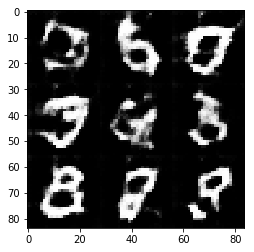

Epoch 1/2... Discriminator Loss: 1.4322... Generator Loss: 0.4229


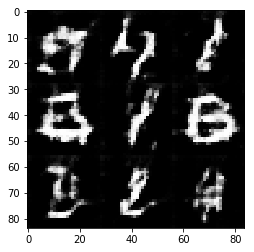

Epoch 1/2... Discriminator Loss: 1.0012... Generator Loss: 1.0363


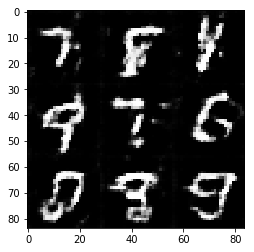

Epoch 1/2... Discriminator Loss: 0.8364... Generator Loss: 1.1742


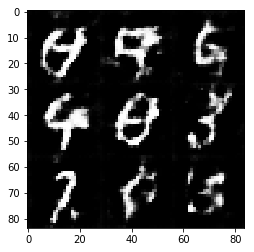

Epoch 1/2... Discriminator Loss: 0.9842... Generator Loss: 2.1428


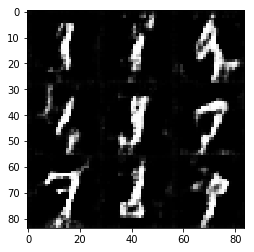

Epoch 1/2... Discriminator Loss: 0.8913... Generator Loss: 1.5409


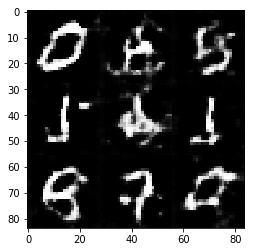

Epoch 1/2... Discriminator Loss: 0.9846... Generator Loss: 0.8207


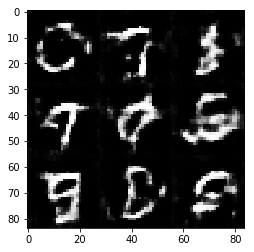

Epoch 1/2... Discriminator Loss: 1.3214... Generator Loss: 0.4685


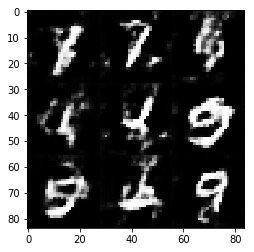

Epoch 1/2... Discriminator Loss: 1.3360... Generator Loss: 0.4823


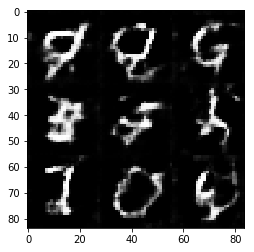

Epoch 1/2... Discriminator Loss: 1.6579... Generator Loss: 2.1538


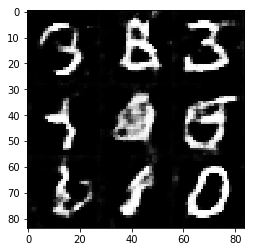

Epoch 1/2... Discriminator Loss: 1.8942... Generator Loss: 0.2481


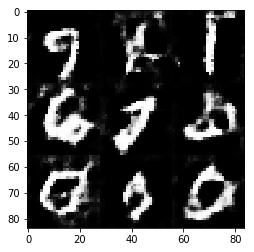

Epoch 1/2... Discriminator Loss: 0.9425... Generator Loss: 1.4880


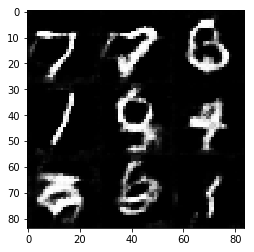

Epoch 1/2... Discriminator Loss: 2.4714... Generator Loss: 3.2382


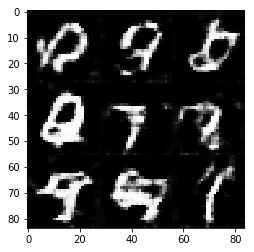

Epoch 1/2... Discriminator Loss: 1.1274... Generator Loss: 0.7009


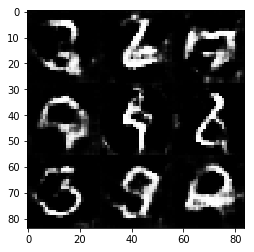

Epoch 1/2... Discriminator Loss: 2.1945... Generator Loss: 0.1845


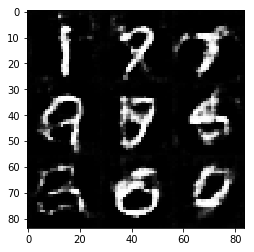

Epoch 1/2... Discriminator Loss: 1.3942... Generator Loss: 0.4636


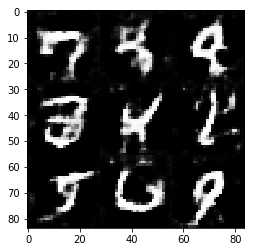

Epoch 1/2... Discriminator Loss: 1.1893... Generator Loss: 1.5754


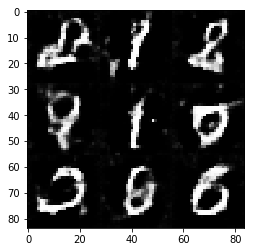

Epoch 1/2... Discriminator Loss: 1.3846... Generator Loss: 0.4109


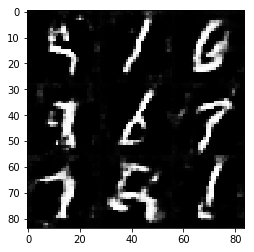

Epoch 1/2... Discriminator Loss: 1.7265... Generator Loss: 0.2997


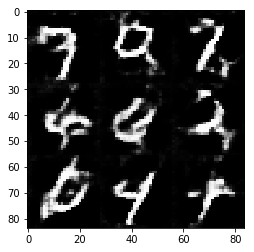

Epoch 1/2... Discriminator Loss: 1.7229... Generator Loss: 0.3459


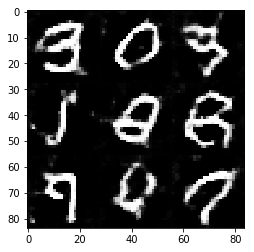

Epoch 1/2... Discriminator Loss: 1.0460... Generator Loss: 0.7965


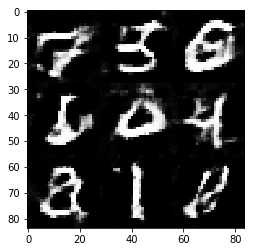

Epoch 1/2... Discriminator Loss: 1.0724... Generator Loss: 0.7500


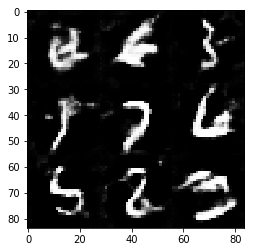

Epoch 1/2... Discriminator Loss: 1.0771... Generator Loss: 0.9172


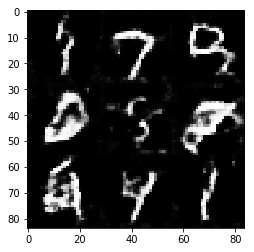

Epoch 1/2... Discriminator Loss: 1.4401... Generator Loss: 0.4386


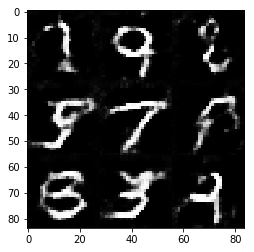

Epoch 1/2... Discriminator Loss: 1.0088... Generator Loss: 0.7298


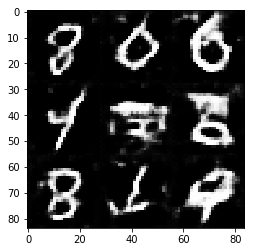

Epoch 1/2... Discriminator Loss: 1.1393... Generator Loss: 0.7659


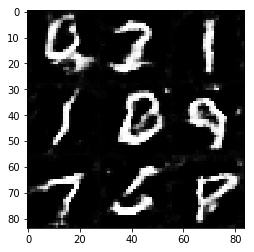

Epoch 1/2... Discriminator Loss: 1.5962... Generator Loss: 0.3360


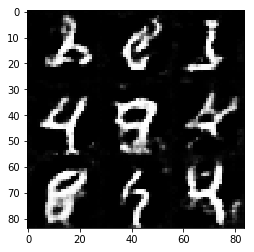

Epoch 1/2... Discriminator Loss: 1.3408... Generator Loss: 0.4444


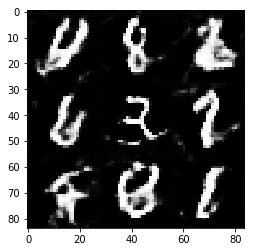

Epoch 1/2... Discriminator Loss: 0.9207... Generator Loss: 0.9761


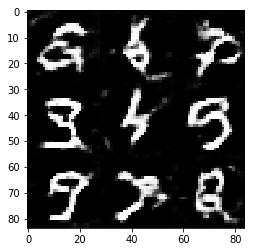

Epoch 1/2... Discriminator Loss: 1.2521... Generator Loss: 0.6644


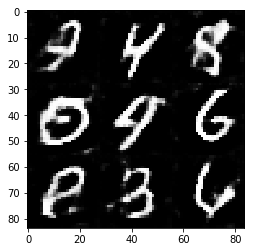

Epoch 1/2... Discriminator Loss: 1.0406... Generator Loss: 0.9588


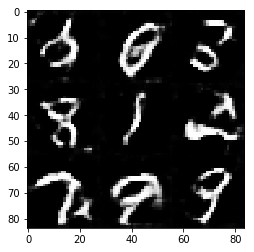

Epoch 1/2... Discriminator Loss: 1.1796... Generator Loss: 0.6364


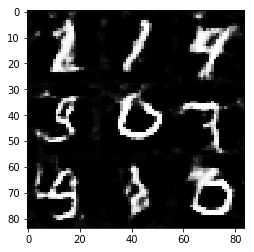

Epoch 1/2... Discriminator Loss: 1.4818... Generator Loss: 0.3448


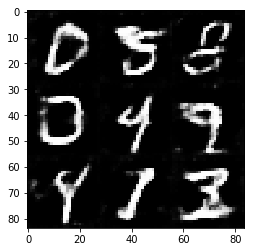

Epoch 1/2... Discriminator Loss: 1.1284... Generator Loss: 0.6526


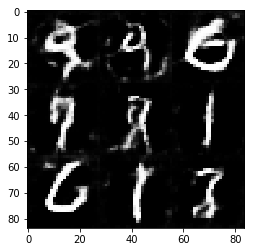

Epoch 1/2... Discriminator Loss: 1.0233... Generator Loss: 1.5058


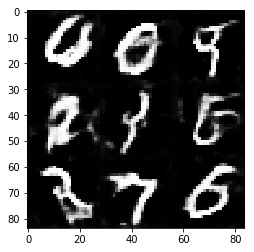

Epoch 1/2... Discriminator Loss: 1.0064... Generator Loss: 0.8484


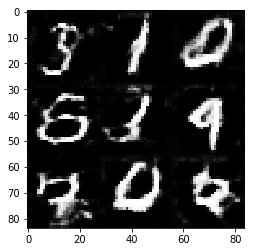

Epoch 1/2... Discriminator Loss: 1.1714... Generator Loss: 0.7587


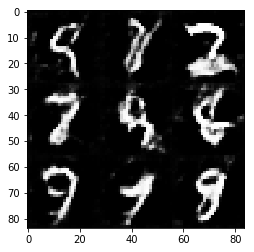

Epoch 1/2... Discriminator Loss: 1.4961... Generator Loss: 2.2152


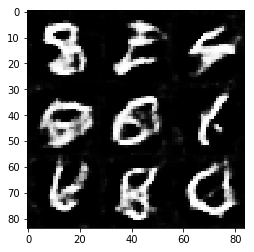

Epoch 1/2... Discriminator Loss: 1.0886... Generator Loss: 0.6503


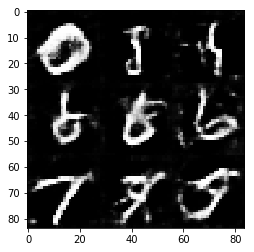

Epoch 1/2... Discriminator Loss: 1.0189... Generator Loss: 0.7092


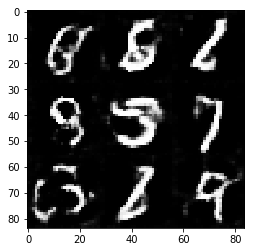

Epoch 1/2... Discriminator Loss: 0.7489... Generator Loss: 1.1397


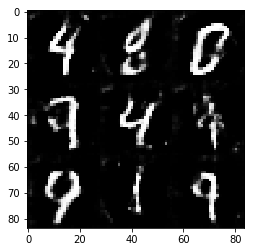

Epoch 1/2... Discriminator Loss: 0.9947... Generator Loss: 0.8347


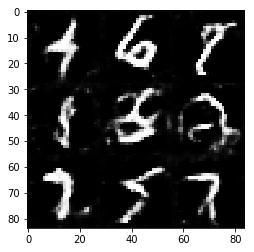

Epoch 1/2... Discriminator Loss: 1.3521... Generator Loss: 0.5068


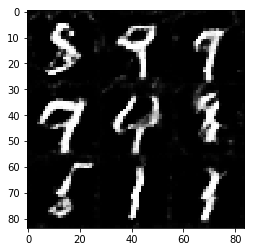

Epoch 1/2... Discriminator Loss: 1.2559... Generator Loss: 0.5272


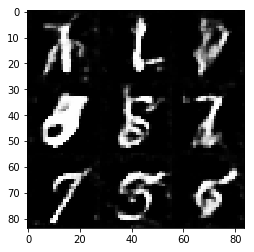

Epoch 1/2... Discriminator Loss: 1.1652... Generator Loss: 2.7630


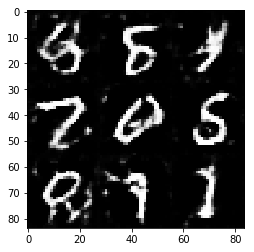

Epoch 1/2... Discriminator Loss: 2.0903... Generator Loss: 0.2394


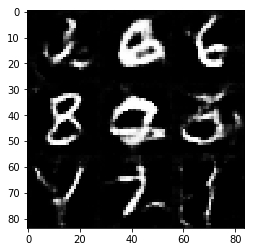

Epoch 1/2... Discriminator Loss: 1.1966... Generator Loss: 1.2373


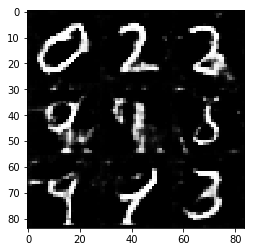

Epoch 1/2... Discriminator Loss: 1.0359... Generator Loss: 1.0223


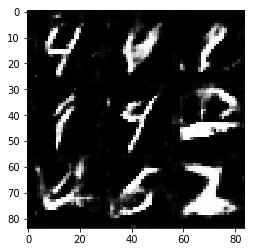

Epoch 1/2... Discriminator Loss: 1.0019... Generator Loss: 2.0609


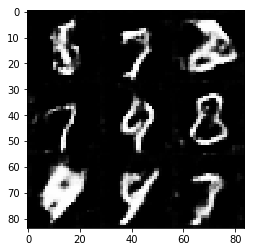

Epoch 1/2... Discriminator Loss: 0.7770... Generator Loss: 1.5659


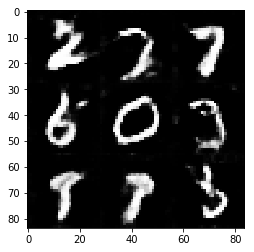

Epoch 1/2... Discriminator Loss: 1.0939... Generator Loss: 0.6085


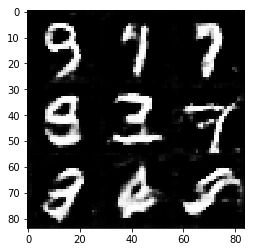

Epoch 1/2... Discriminator Loss: 0.7750... Generator Loss: 1.4422


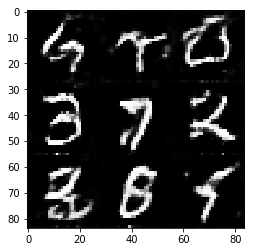

Epoch 1/2... Discriminator Loss: 1.2292... Generator Loss: 0.6298


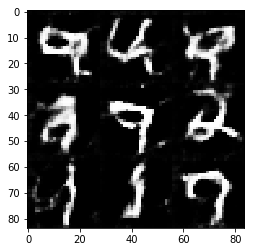

Epoch 1/2... Discriminator Loss: 1.4302... Generator Loss: 0.4143


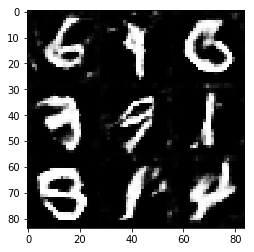

Epoch 1/2... Discriminator Loss: 1.4287... Generator Loss: 0.3753


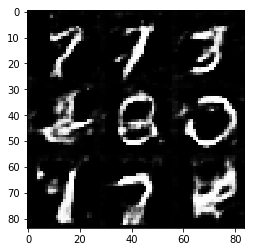

Epoch 1/2... Discriminator Loss: 0.8790... Generator Loss: 0.8684


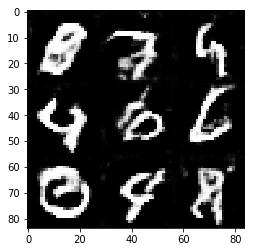

Epoch 1/2... Discriminator Loss: 1.3750... Generator Loss: 0.4461


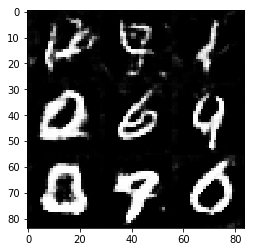

Epoch 1/2... Discriminator Loss: 1.7145... Generator Loss: 0.2873


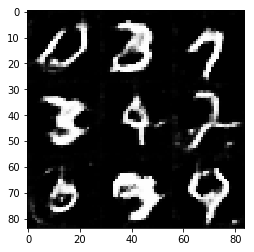

Epoch 1/2... Discriminator Loss: 0.8405... Generator Loss: 1.8494


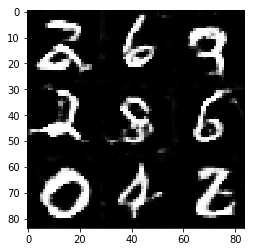

Epoch 1/2... Discriminator Loss: 0.7508... Generator Loss: 1.0526


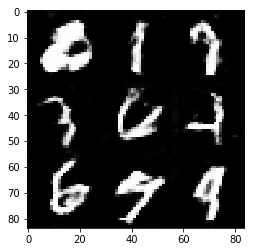

Epoch 1/2... Discriminator Loss: 0.8289... Generator Loss: 2.0213


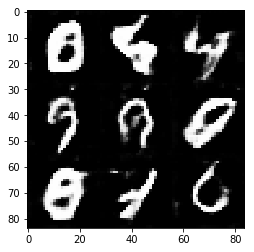

Epoch 1/2... Discriminator Loss: 1.2021... Generator Loss: 1.0074


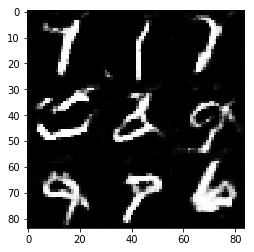

Epoch 1/2... Discriminator Loss: 1.4877... Generator Loss: 0.4394


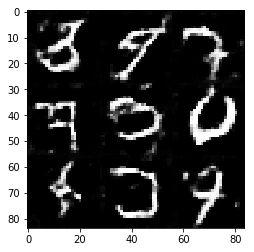

Epoch 1/2... Discriminator Loss: 0.9792... Generator Loss: 1.0158


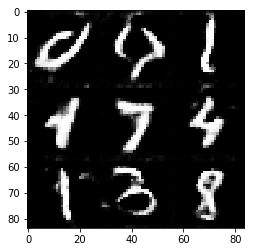

Epoch 1/2... Discriminator Loss: 0.8977... Generator Loss: 1.8145


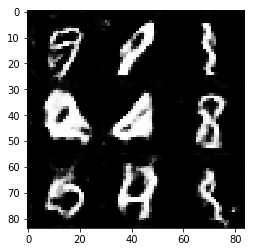

Epoch 1/2... Discriminator Loss: 0.9899... Generator Loss: 0.8155


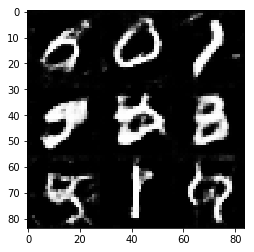

Epoch 1/2... Discriminator Loss: 1.5055... Generator Loss: 0.3990


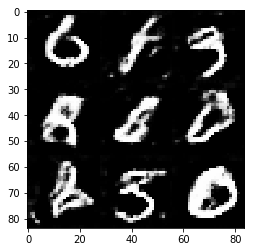

Epoch 1/2... Discriminator Loss: 0.7938... Generator Loss: 1.2466


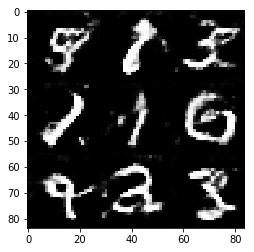

Epoch 1/2... Discriminator Loss: 1.6738... Generator Loss: 0.4441


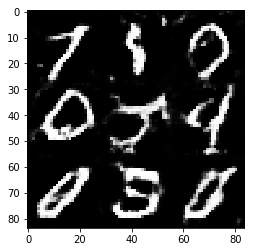

Epoch 1/2... Discriminator Loss: 0.8891... Generator Loss: 1.7714


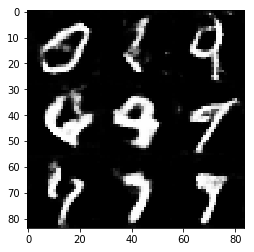

Epoch 1/2... Discriminator Loss: 1.1426... Generator Loss: 0.6243


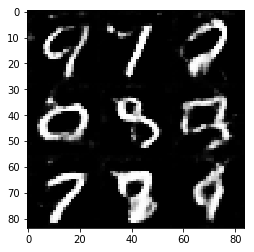

Epoch 1/2... Discriminator Loss: 0.9919... Generator Loss: 0.8667


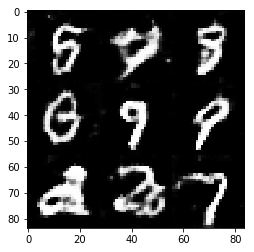

Epoch 1/2... Discriminator Loss: 1.4747... Generator Loss: 1.9596


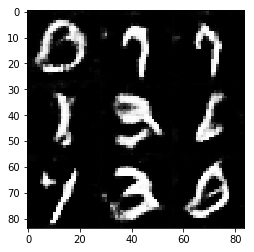

Epoch 1/2... Discriminator Loss: 1.3133... Generator Loss: 0.4986


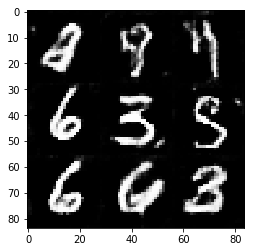

Epoch 1/2... Discriminator Loss: 1.1628... Generator Loss: 0.6069


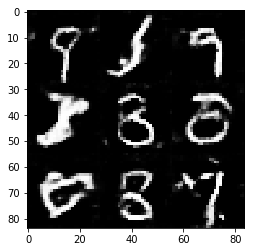

Epoch 1/2... Discriminator Loss: 1.3860... Generator Loss: 0.5031


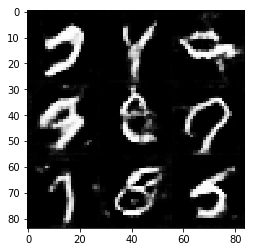

Epoch 1/2... Discriminator Loss: 0.8712... Generator Loss: 1.0006


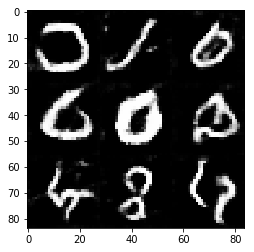

Epoch 1/2... Discriminator Loss: 1.0501... Generator Loss: 1.1000


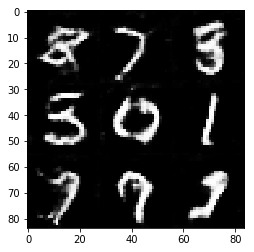

Epoch 1/2... Discriminator Loss: 0.7711... Generator Loss: 1.6857


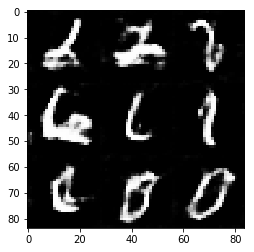

Epoch 1/2... Discriminator Loss: 1.4002... Generator Loss: 0.4171


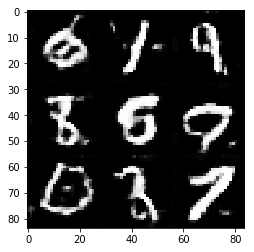

Epoch 1/2... Discriminator Loss: 1.6648... Generator Loss: 0.3295


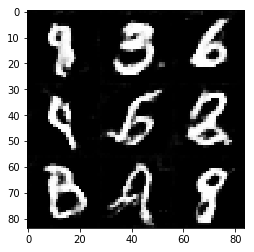

Epoch 1/2... Discriminator Loss: 1.7968... Generator Loss: 0.3194


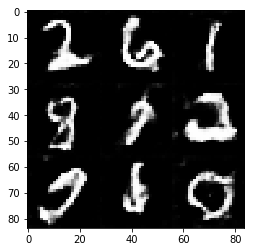

Epoch 1/2... Discriminator Loss: 1.4155... Generator Loss: 0.4794


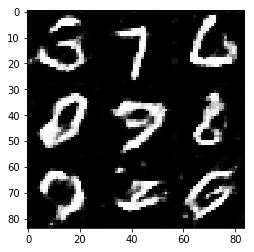

Epoch 1/2... Discriminator Loss: 0.9436... Generator Loss: 1.8893


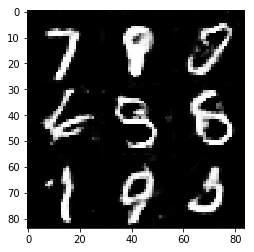

Epoch 1/2... Discriminator Loss: 1.3106... Generator Loss: 0.5176


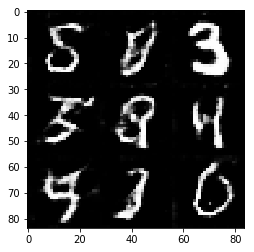

Epoch 1/2... Discriminator Loss: 2.5574... Generator Loss: 0.1775


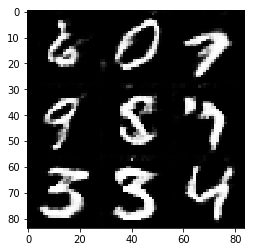

Epoch 1/2... Discriminator Loss: 0.8753... Generator Loss: 0.9191


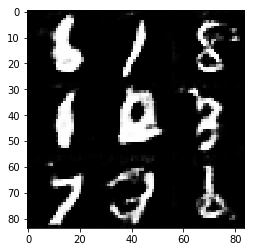

Epoch 2/2... Discriminator Loss: 1.4143... Generator Loss: 0.4670


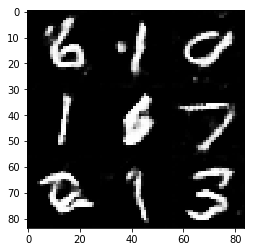

Epoch 2/2... Discriminator Loss: 1.3248... Generator Loss: 0.5254


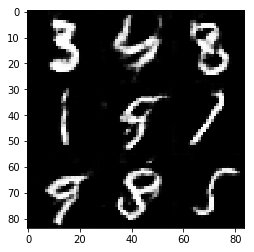

Epoch 2/2... Discriminator Loss: 1.1517... Generator Loss: 0.6197


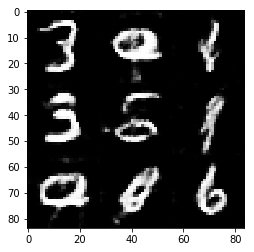

Epoch 2/2... Discriminator Loss: 0.7938... Generator Loss: 0.9443


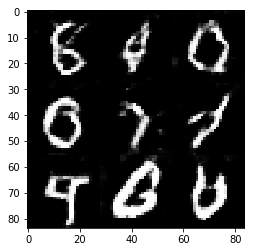

Epoch 2/2... Discriminator Loss: 1.5757... Generator Loss: 2.7427


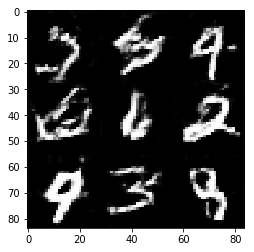

Epoch 2/2... Discriminator Loss: 0.8954... Generator Loss: 1.5244


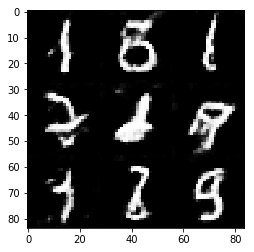

Epoch 2/2... Discriminator Loss: 0.7347... Generator Loss: 1.1889


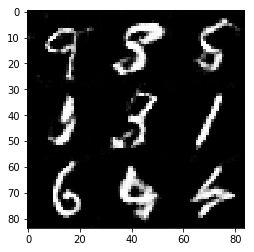

Epoch 2/2... Discriminator Loss: 1.5094... Generator Loss: 0.4193


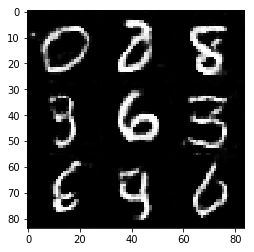

Epoch 2/2... Discriminator Loss: 0.9669... Generator Loss: 1.3826


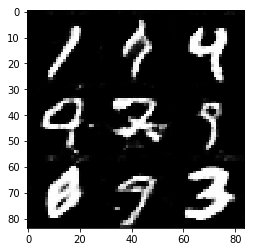

Epoch 2/2... Discriminator Loss: 0.8762... Generator Loss: 1.0145


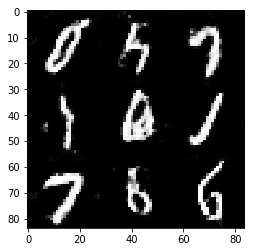

Epoch 2/2... Discriminator Loss: 1.0294... Generator Loss: 0.6775


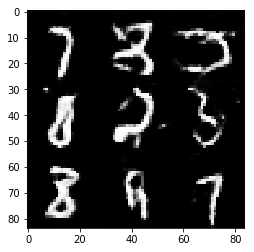

Epoch 2/2... Discriminator Loss: 0.6500... Generator Loss: 1.2497


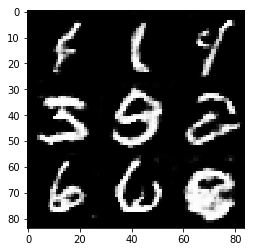

Epoch 2/2... Discriminator Loss: 1.0879... Generator Loss: 1.0292


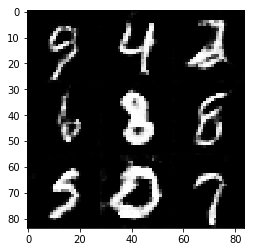

Epoch 2/2... Discriminator Loss: 0.8222... Generator Loss: 1.5763


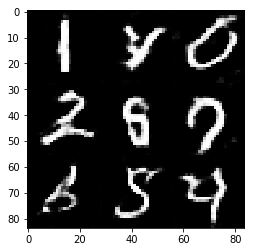

Epoch 2/2... Discriminator Loss: 0.9837... Generator Loss: 2.0694


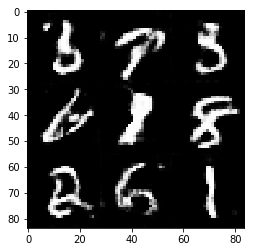

Epoch 2/2... Discriminator Loss: 1.7976... Generator Loss: 0.2779


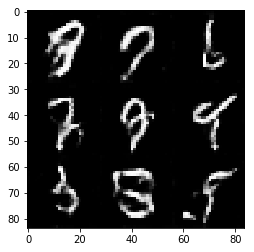

Epoch 2/2... Discriminator Loss: 0.7618... Generator Loss: 1.0608


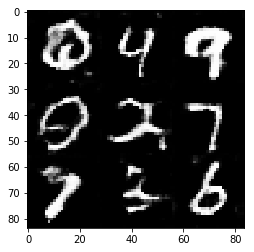

Epoch 2/2... Discriminator Loss: 0.9507... Generator Loss: 1.2136


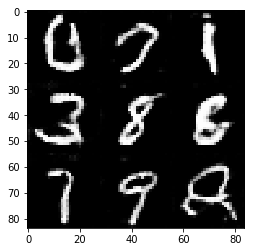

Epoch 2/2... Discriminator Loss: 0.9976... Generator Loss: 1.8266


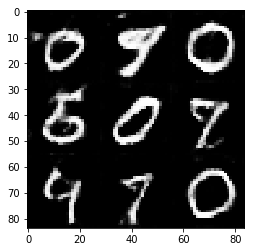

Epoch 2/2... Discriminator Loss: 0.9209... Generator Loss: 0.9098


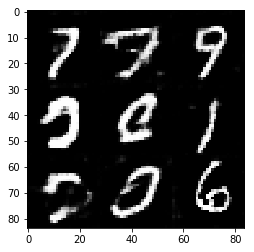

Epoch 2/2... Discriminator Loss: 0.6767... Generator Loss: 1.2461


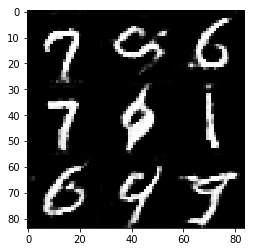

Epoch 2/2... Discriminator Loss: 1.2615... Generator Loss: 0.5120


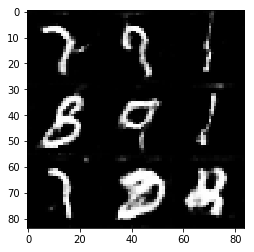

Epoch 2/2... Discriminator Loss: 1.5032... Generator Loss: 0.4479


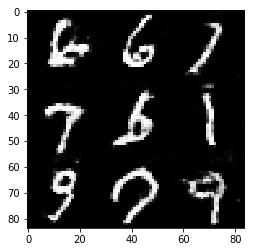

Epoch 2/2... Discriminator Loss: 0.6273... Generator Loss: 1.2604


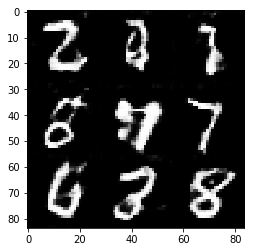

Epoch 2/2... Discriminator Loss: 1.6388... Generator Loss: 0.3998


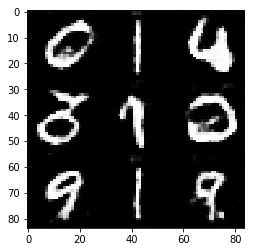

Epoch 2/2... Discriminator Loss: 0.9013... Generator Loss: 1.2028


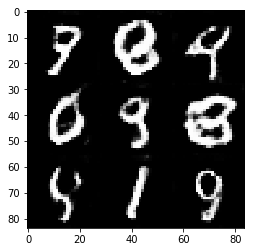

Epoch 2/2... Discriminator Loss: 1.2113... Generator Loss: 0.6551


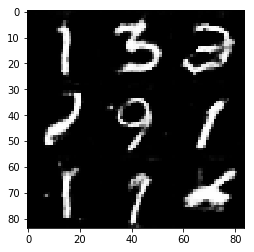

Epoch 2/2... Discriminator Loss: 1.0637... Generator Loss: 1.1650


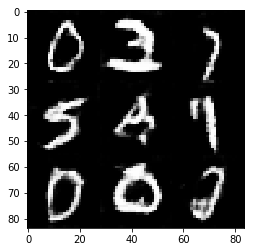

Epoch 2/2... Discriminator Loss: 0.9162... Generator Loss: 0.9418


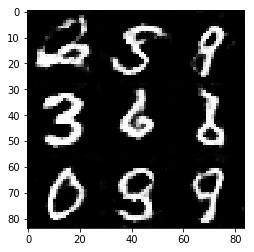

Epoch 2/2... Discriminator Loss: 1.0531... Generator Loss: 0.8705


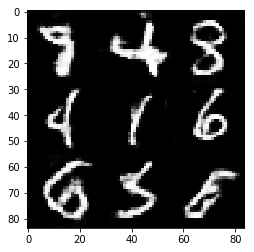

Epoch 2/2... Discriminator Loss: 0.8455... Generator Loss: 1.1402


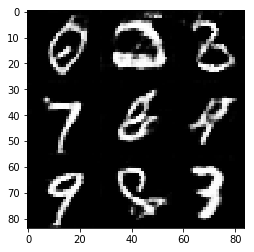

Epoch 2/2... Discriminator Loss: 0.7232... Generator Loss: 1.7769


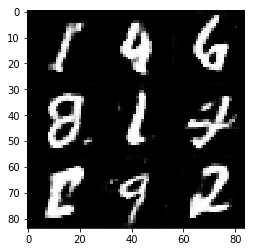

Epoch 2/2... Discriminator Loss: 0.6700... Generator Loss: 1.9057


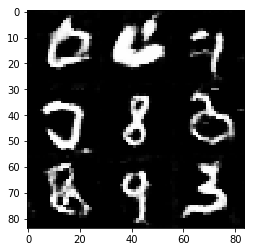

Epoch 2/2... Discriminator Loss: 1.1064... Generator Loss: 1.5569


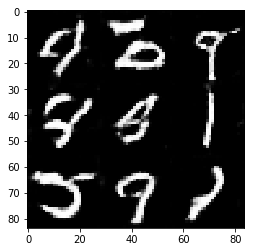

Epoch 2/2... Discriminator Loss: 0.9184... Generator Loss: 1.4066


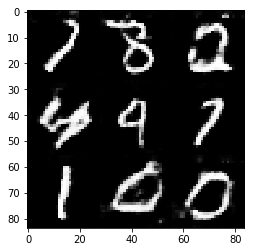

Epoch 2/2... Discriminator Loss: 0.8749... Generator Loss: 1.1869


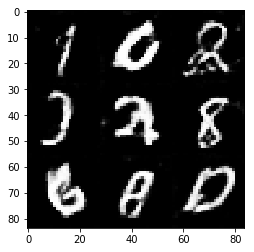

Epoch 2/2... Discriminator Loss: 0.8192... Generator Loss: 1.6354


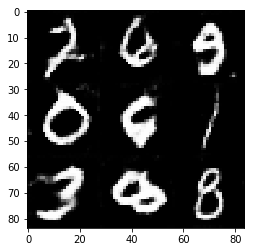

Epoch 2/2... Discriminator Loss: 0.6631... Generator Loss: 1.2915


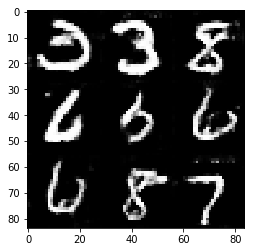

Epoch 2/2... Discriminator Loss: 0.8595... Generator Loss: 2.2900


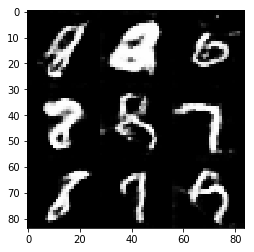

Epoch 2/2... Discriminator Loss: 1.2415... Generator Loss: 0.5538


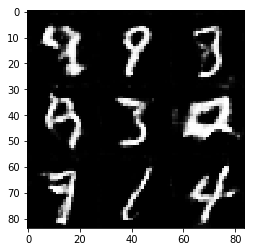

Epoch 2/2... Discriminator Loss: 1.0159... Generator Loss: 0.8480


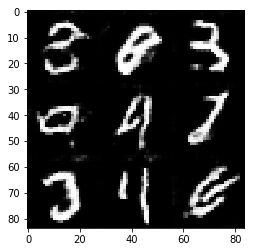

Epoch 2/2... Discriminator Loss: 1.9509... Generator Loss: 0.2362


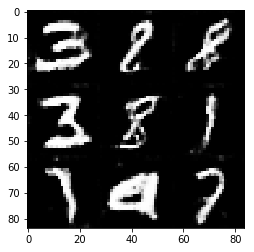

Epoch 2/2... Discriminator Loss: 0.9933... Generator Loss: 0.7460


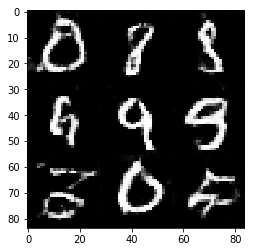

Epoch 2/2... Discriminator Loss: 1.9736... Generator Loss: 0.3938


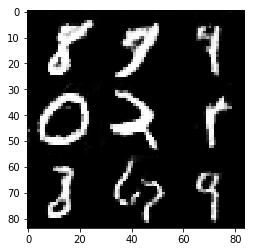

Epoch 2/2... Discriminator Loss: 0.8255... Generator Loss: 1.0537


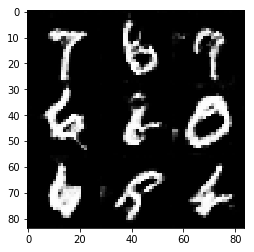

Epoch 2/2... Discriminator Loss: 2.8268... Generator Loss: 0.1150


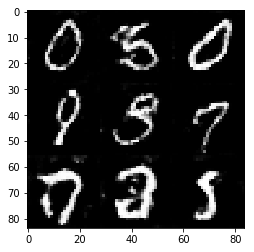

Epoch 2/2... Discriminator Loss: 1.1019... Generator Loss: 0.7621


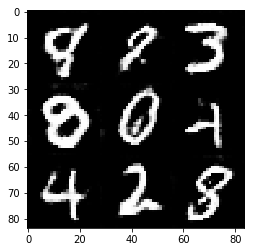

Epoch 2/2... Discriminator Loss: 2.1755... Generator Loss: 0.2532


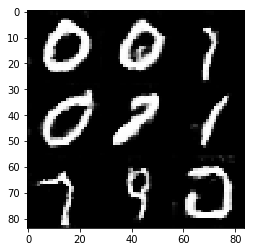

Epoch 2/2... Discriminator Loss: 1.2446... Generator Loss: 2.1684


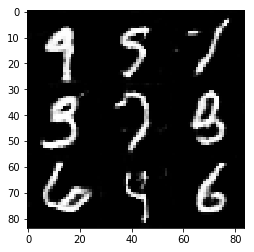

Epoch 2/2... Discriminator Loss: 1.0716... Generator Loss: 0.6984


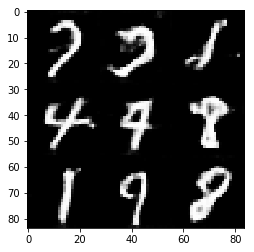

Epoch 2/2... Discriminator Loss: 1.1225... Generator Loss: 0.6989


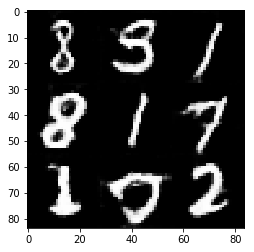

Epoch 2/2... Discriminator Loss: 0.8463... Generator Loss: 1.0210


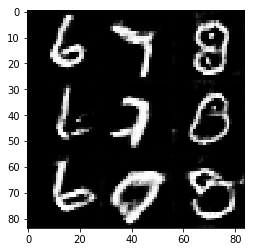

Epoch 2/2... Discriminator Loss: 0.9531... Generator Loss: 0.7621


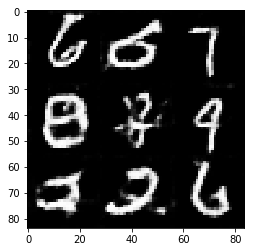

Epoch 2/2... Discriminator Loss: 1.2752... Generator Loss: 0.5928


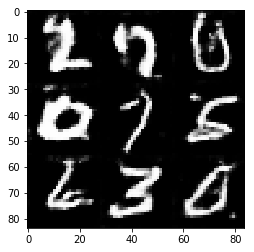

Epoch 2/2... Discriminator Loss: 0.7805... Generator Loss: 1.3316


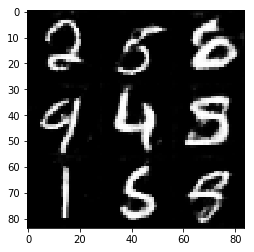

Epoch 2/2... Discriminator Loss: 0.9412... Generator Loss: 1.7720


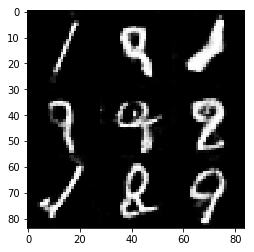

Epoch 2/2... Discriminator Loss: 0.8073... Generator Loss: 1.1294


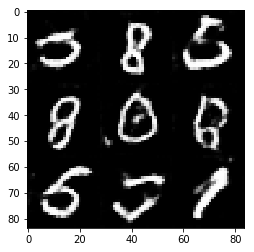

Epoch 2/2... Discriminator Loss: 1.0895... Generator Loss: 1.7212


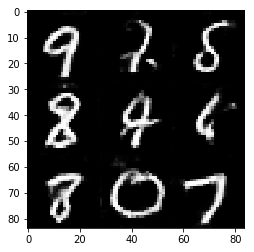

Epoch 2/2... Discriminator Loss: 1.2943... Generator Loss: 0.8506


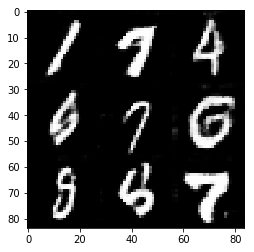

Epoch 2/2... Discriminator Loss: 1.3965... Generator Loss: 0.4868


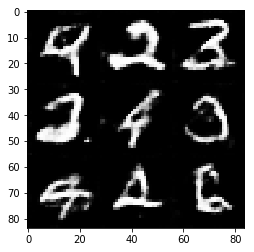

Epoch 2/2... Discriminator Loss: 1.0030... Generator Loss: 0.8671


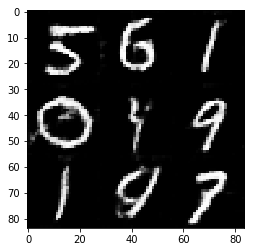

Epoch 2/2... Discriminator Loss: 0.8432... Generator Loss: 1.8890


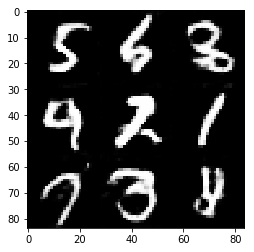

Epoch 2/2... Discriminator Loss: 0.8287... Generator Loss: 1.4858


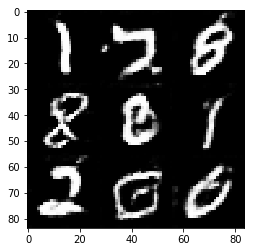

Epoch 2/2... Discriminator Loss: 1.2457... Generator Loss: 0.4788


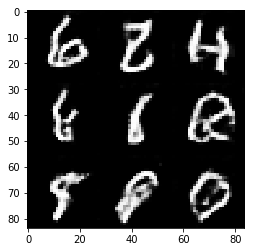

Epoch 2/2... Discriminator Loss: 1.0269... Generator Loss: 0.7854


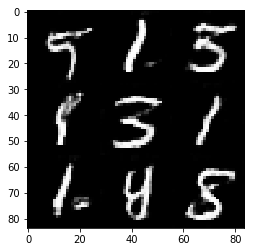

Epoch 2/2... Discriminator Loss: 0.8746... Generator Loss: 1.7551


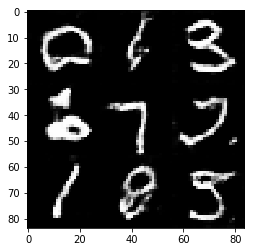

Epoch 2/2... Discriminator Loss: 1.1583... Generator Loss: 0.6370


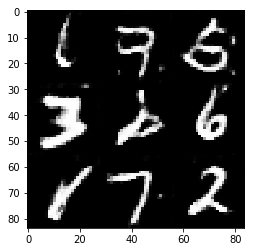

Epoch 2/2... Discriminator Loss: 0.8496... Generator Loss: 0.9249


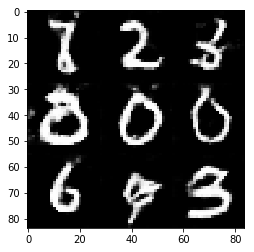

Epoch 2/2... Discriminator Loss: 0.7440... Generator Loss: 1.1467


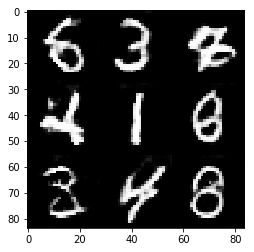

Epoch 2/2... Discriminator Loss: 1.1068... Generator Loss: 0.9086


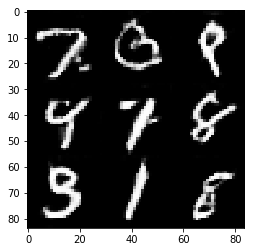

Epoch 2/2... Discriminator Loss: 1.7514... Generator Loss: 3.1201


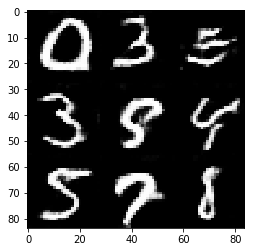

Epoch 2/2... Discriminator Loss: 0.7380... Generator Loss: 1.3417


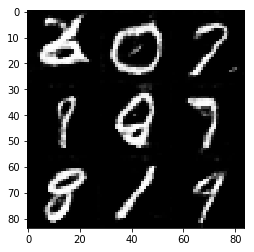

Epoch 2/2... Discriminator Loss: 1.4278... Generator Loss: 0.4743


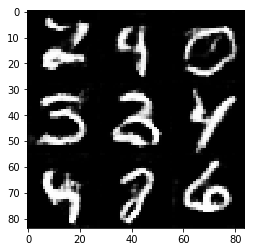

Epoch 2/2... Discriminator Loss: 1.0162... Generator Loss: 0.7208


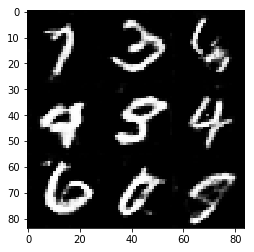

Epoch 2/2... Discriminator Loss: 0.5363... Generator Loss: 1.7764


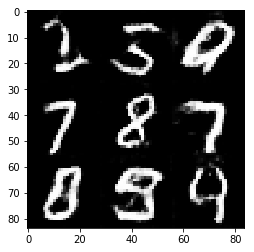

Epoch 2/2... Discriminator Loss: 1.7007... Generator Loss: 0.4217


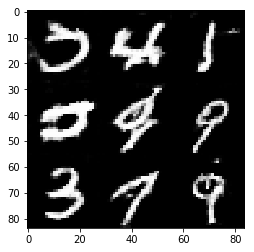

Epoch 2/2... Discriminator Loss: 2.4008... Generator Loss: 0.1789


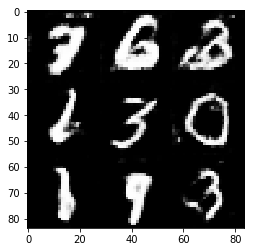

Epoch 2/2... Discriminator Loss: 1.6362... Generator Loss: 0.3565


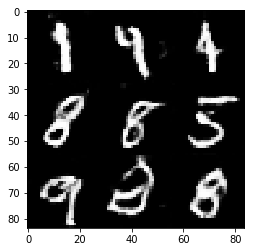

Epoch 2/2... Discriminator Loss: 1.6284... Generator Loss: 0.4424


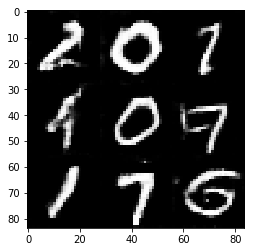

Epoch 2/2... Discriminator Loss: 0.8105... Generator Loss: 1.1083


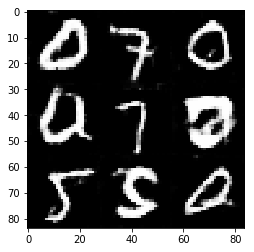

Epoch 2/2... Discriminator Loss: 0.9905... Generator Loss: 2.3734


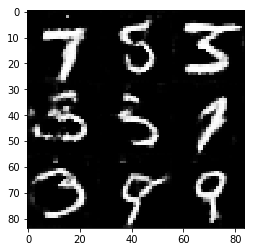

Epoch 2/2... Discriminator Loss: 0.7471... Generator Loss: 2.1043


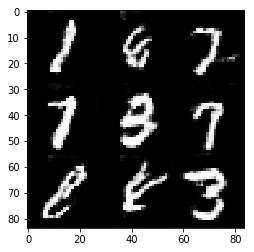

Epoch 2/2... Discriminator Loss: 0.8163... Generator Loss: 1.7817


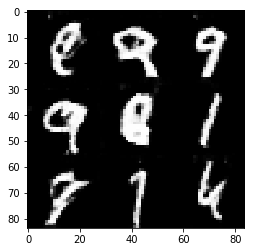

Epoch 2/2... Discriminator Loss: 0.9946... Generator Loss: 0.7604


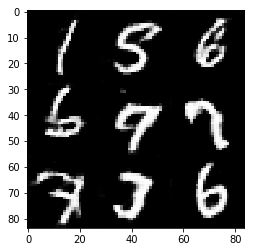

Epoch 2/2... Discriminator Loss: 1.2367... Generator Loss: 0.5135


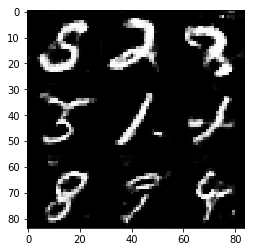

Epoch 2/2... Discriminator Loss: 0.8102... Generator Loss: 2.1389


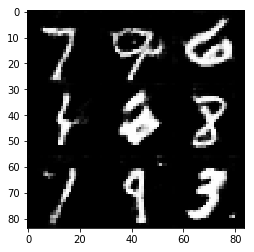

Epoch 2/2... Discriminator Loss: 0.8438... Generator Loss: 1.0346


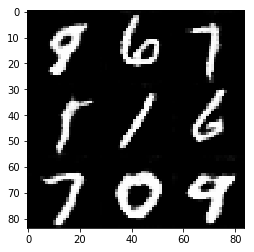

Epoch 2/2... Discriminator Loss: 1.2422... Generator Loss: 0.8985


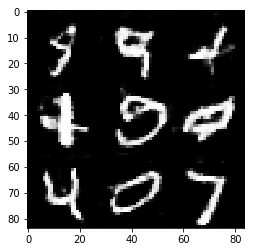

Epoch 2/2... Discriminator Loss: 0.8310... Generator Loss: 1.0111


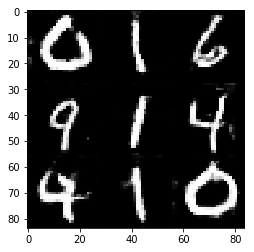

Epoch 2/2... Discriminator Loss: 1.2359... Generator Loss: 1.3441


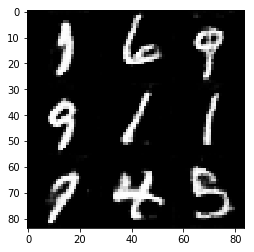

Epoch 2/2... Discriminator Loss: 1.3615... Generator Loss: 0.4861


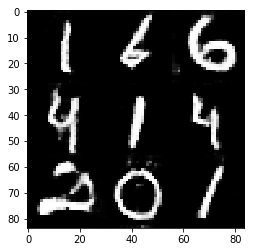

Epoch 2/2... Discriminator Loss: 0.7704... Generator Loss: 1.1919


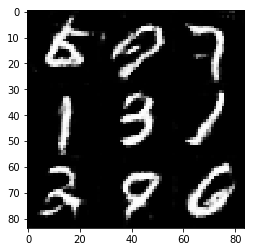

Epoch 2/2... Discriminator Loss: 0.8665... Generator Loss: 0.8871


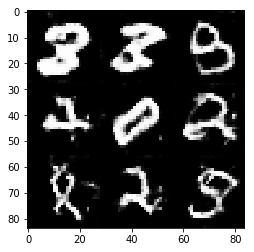

Epoch 2/2... Discriminator Loss: 0.7802... Generator Loss: 1.0475


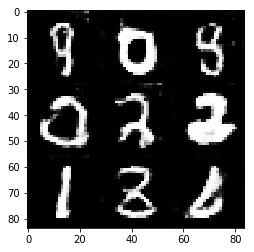

Epoch 2/2... Discriminator Loss: 1.0514... Generator Loss: 2.4318


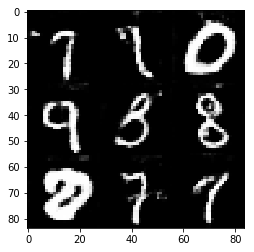

Epoch 2/2... Discriminator Loss: 1.0928... Generator Loss: 0.8137


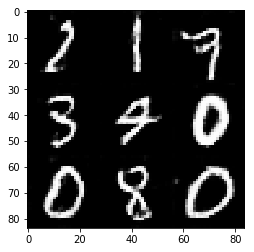

Epoch 2/2... Discriminator Loss: 1.5344... Generator Loss: 0.4121


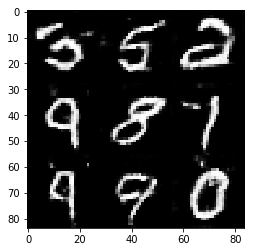

Epoch 2/2... Discriminator Loss: 1.4154... Generator Loss: 0.4524


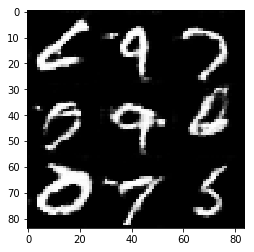

Epoch 2/2... Discriminator Loss: 1.0593... Generator Loss: 0.6674


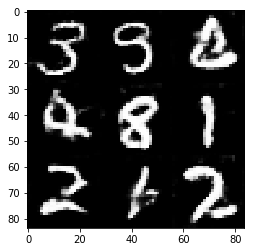

Epoch 2/2... Discriminator Loss: 1.1248... Generator Loss: 0.7298


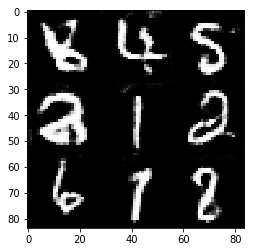

Epoch 2/2... Discriminator Loss: 1.8783... Generator Loss: 0.3923


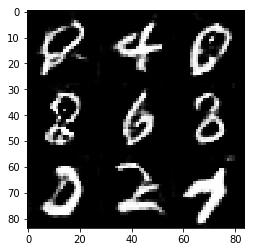

Epoch 2/2... Discriminator Loss: 1.2875... Generator Loss: 0.5654


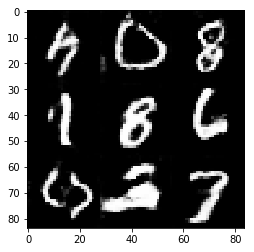

Epoch 2/2... Discriminator Loss: 0.9385... Generator Loss: 2.8952


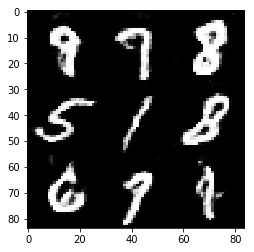

Epoch 2/2... Discriminator Loss: 0.7857... Generator Loss: 0.9402


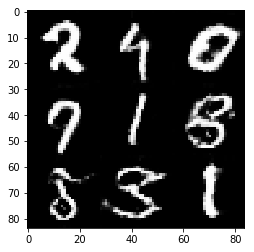

Epoch 2/2... Discriminator Loss: 1.8767... Generator Loss: 0.3097


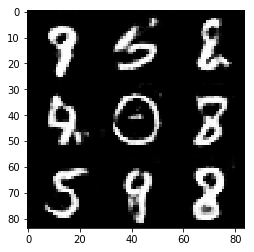

Epoch 2/2... Discriminator Loss: 1.0156... Generator Loss: 0.7246


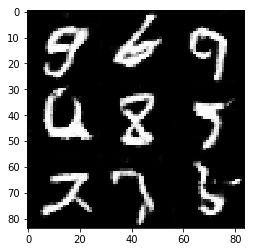

Epoch 2/2... Discriminator Loss: 0.7984... Generator Loss: 0.9634


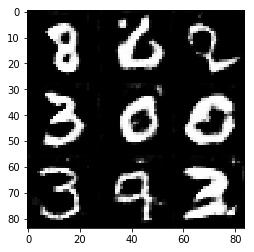

Epoch 2/2... Discriminator Loss: 0.7243... Generator Loss: 1.0519


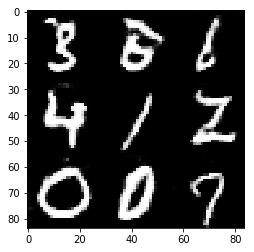

Epoch 2/2... Discriminator Loss: 1.1824... Generator Loss: 0.6613


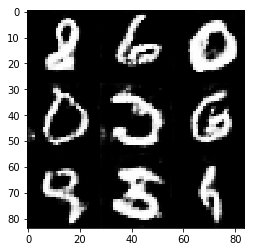

Epoch 2/2... Discriminator Loss: 1.0297... Generator Loss: 0.8153


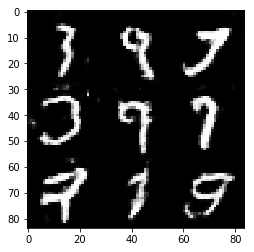

Epoch 2/2... Discriminator Loss: 1.1270... Generator Loss: 0.6653


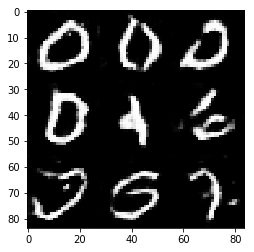

Epoch 2/2... Discriminator Loss: 0.7974... Generator Loss: 2.0893


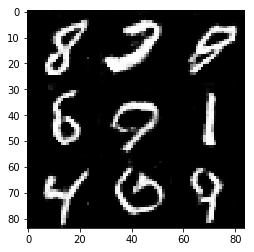

Epoch 2/2... Discriminator Loss: 2.7645... Generator Loss: 0.1518


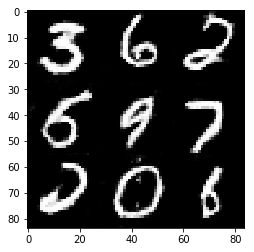

Epoch 2/2... Discriminator Loss: 1.4314... Generator Loss: 3.2516


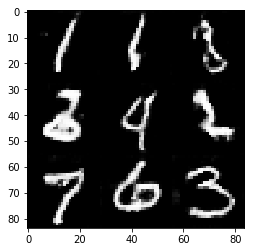

Epoch 2/2... Discriminator Loss: 0.7515... Generator Loss: 1.5267


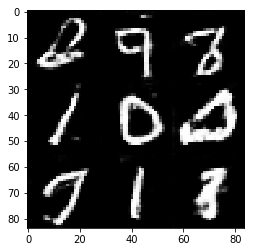

Epoch 2/2... Discriminator Loss: 1.0215... Generator Loss: 1.5955


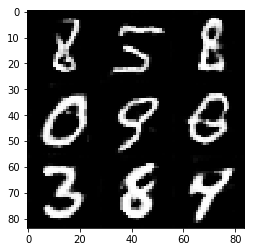

Epoch 2/2... Discriminator Loss: 1.0459... Generator Loss: 0.8270


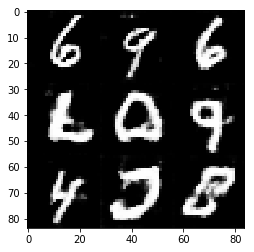

Epoch 2/2... Discriminator Loss: 1.0675... Generator Loss: 0.7320


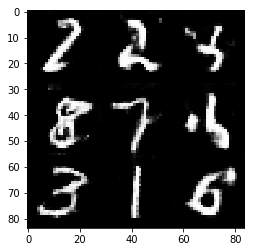

Epoch 2/2... Discriminator Loss: 1.4914... Generator Loss: 0.4147


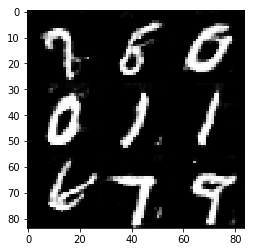

Epoch 2/2... Discriminator Loss: 1.7975... Generator Loss: 0.4270


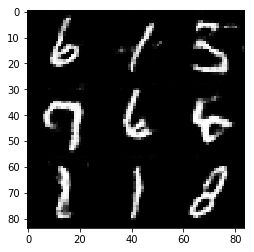

In [56]:
batch_size = 50
z_dim = 100
learning_rate = 0.002
beta1 = 0.5


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 2

mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode)

### CelebA
Run your GANs on CelebA.  It will take around 20 minutes on the average GPU to run one epoch.  You can run the whole epoch or stop when it starts to generate realistic faces.

Epoch 1/1... Discriminator Loss: 12.6475... Generator Loss: 0.1231


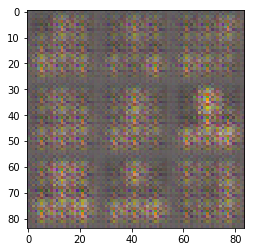

Epoch 1/1... Discriminator Loss: 1.8630... Generator Loss: 0.3563


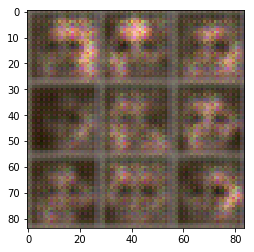

Epoch 1/1... Discriminator Loss: 1.7715... Generator Loss: 2.2784


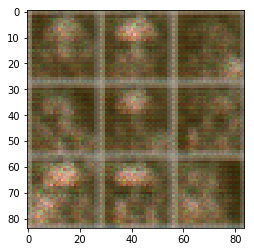

Epoch 1/1... Discriminator Loss: 2.3899... Generator Loss: 0.1172


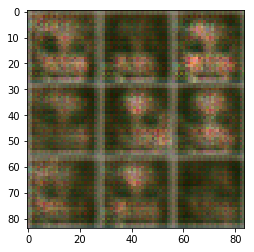

Epoch 1/1... Discriminator Loss: 1.3500... Generator Loss: 1.3520


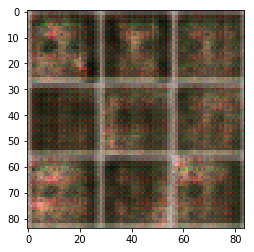

Epoch 1/1... Discriminator Loss: 1.1447... Generator Loss: 1.6526


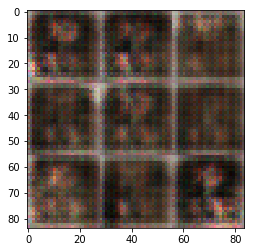

Epoch 1/1... Discriminator Loss: 1.3568... Generator Loss: 1.4617


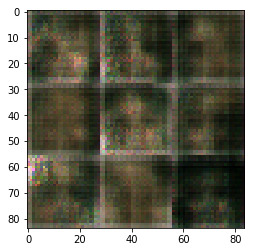

Epoch 1/1... Discriminator Loss: 2.3949... Generator Loss: 0.1383


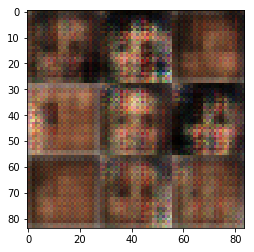

Epoch 1/1... Discriminator Loss: 1.5838... Generator Loss: 0.7755


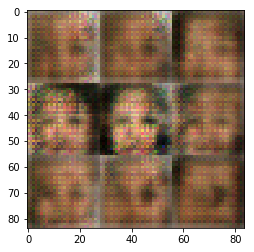

Epoch 1/1... Discriminator Loss: 1.6022... Generator Loss: 0.4208


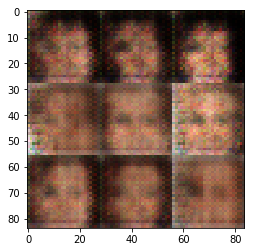

Epoch 1/1... Discriminator Loss: 1.6438... Generator Loss: 0.9199


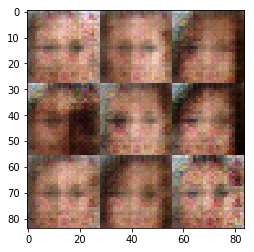

Epoch 1/1... Discriminator Loss: 1.8084... Generator Loss: 0.3697


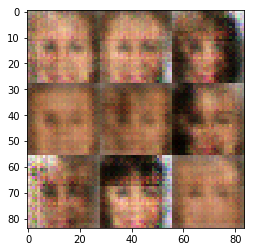

Epoch 1/1... Discriminator Loss: 1.4674... Generator Loss: 0.4303


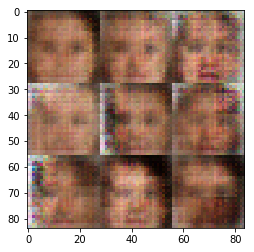

Epoch 1/1... Discriminator Loss: 1.4493... Generator Loss: 0.9213


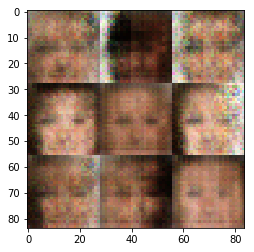

Epoch 1/1... Discriminator Loss: 1.3180... Generator Loss: 0.6475


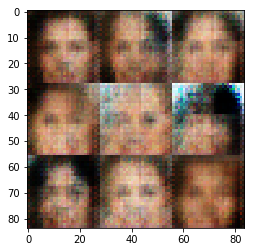

Epoch 1/1... Discriminator Loss: 2.2631... Generator Loss: 1.5487


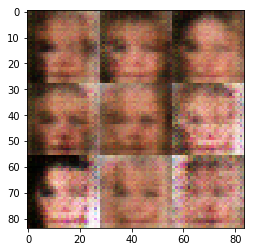

Epoch 1/1... Discriminator Loss: 1.4692... Generator Loss: 0.6246


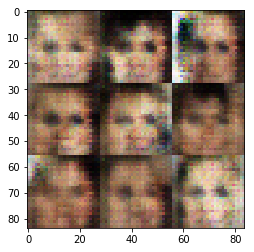

Epoch 1/1... Discriminator Loss: 1.5726... Generator Loss: 1.4334


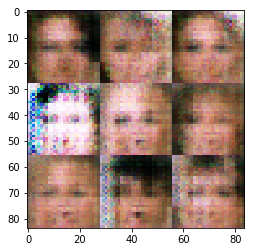

Epoch 1/1... Discriminator Loss: 1.5468... Generator Loss: 0.7917


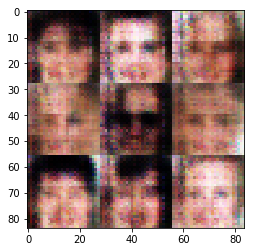

Epoch 1/1... Discriminator Loss: 1.4571... Generator Loss: 0.5324


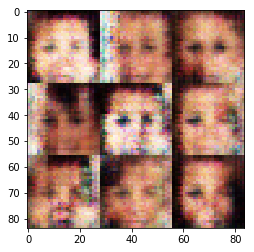

Epoch 1/1... Discriminator Loss: 1.4850... Generator Loss: 0.4418


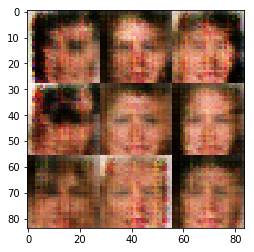

Epoch 1/1... Discriminator Loss: 1.8023... Generator Loss: 1.3163


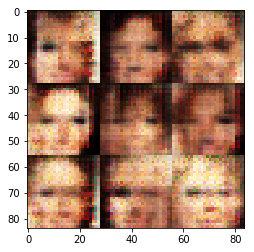

Epoch 1/1... Discriminator Loss: 1.3710... Generator Loss: 0.5713


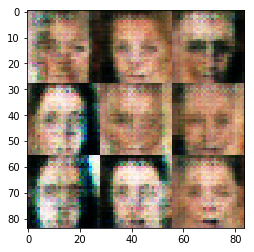

Epoch 1/1... Discriminator Loss: 2.4611... Generator Loss: 0.1168


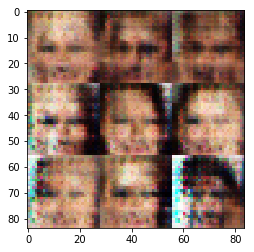

Epoch 1/1... Discriminator Loss: 1.4354... Generator Loss: 0.7987


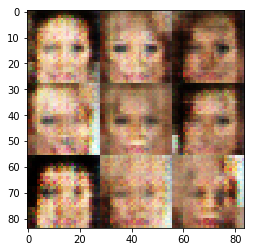

Epoch 1/1... Discriminator Loss: 1.3780... Generator Loss: 0.8165


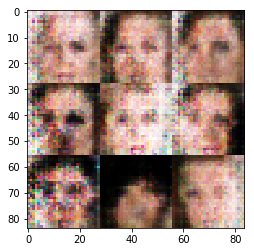

Epoch 1/1... Discriminator Loss: 1.3414... Generator Loss: 0.9594


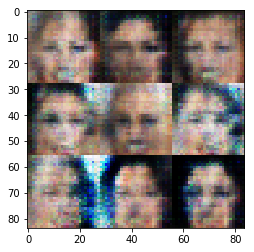

Epoch 1/1... Discriminator Loss: 1.2161... Generator Loss: 0.8340


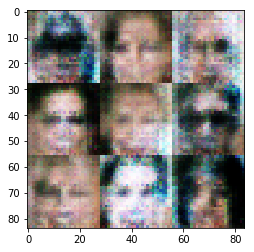

Epoch 1/1... Discriminator Loss: 1.3070... Generator Loss: 0.9440


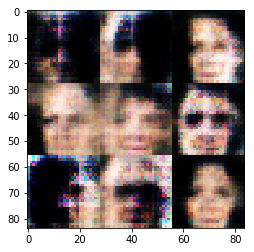

Epoch 1/1... Discriminator Loss: 1.7746... Generator Loss: 0.3464


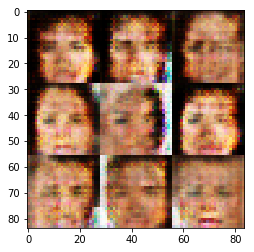

Epoch 1/1... Discriminator Loss: 1.5341... Generator Loss: 0.7327


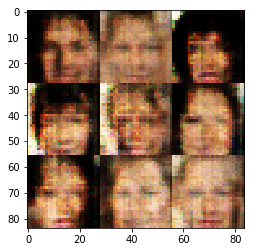

Epoch 1/1... Discriminator Loss: 1.6487... Generator Loss: 0.6328


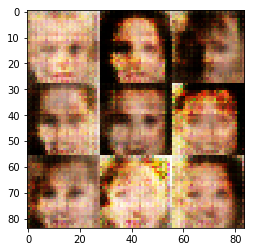

Epoch 1/1... Discriminator Loss: 1.3892... Generator Loss: 0.5519


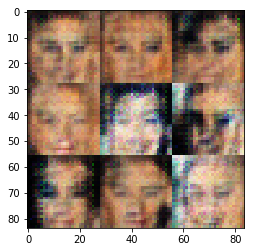

Epoch 1/1... Discriminator Loss: 1.3913... Generator Loss: 0.7679


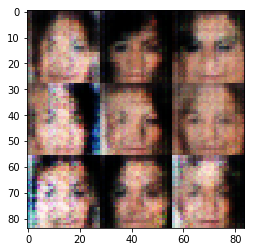

Epoch 1/1... Discriminator Loss: 1.3188... Generator Loss: 0.8625


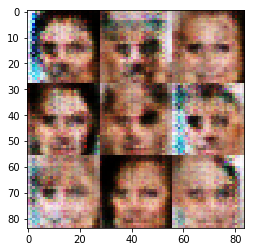

Epoch 1/1... Discriminator Loss: 1.5107... Generator Loss: 0.7025


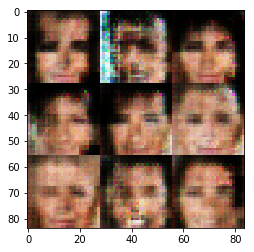

Epoch 1/1... Discriminator Loss: 1.4012... Generator Loss: 0.5461


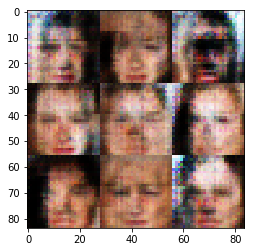

Epoch 1/1... Discriminator Loss: 1.2889... Generator Loss: 0.8784


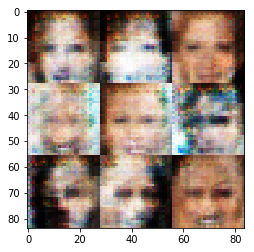

Epoch 1/1... Discriminator Loss: 1.5154... Generator Loss: 0.5202


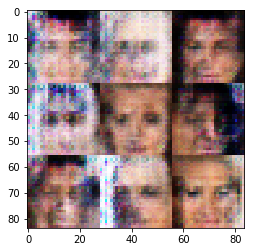

Epoch 1/1... Discriminator Loss: 1.5523... Generator Loss: 0.9783


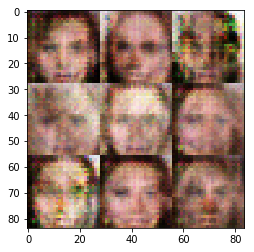

Epoch 1/1... Discriminator Loss: 1.6331... Generator Loss: 1.4657


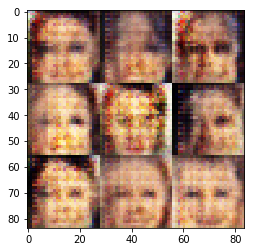

Epoch 1/1... Discriminator Loss: 1.5445... Generator Loss: 0.4086


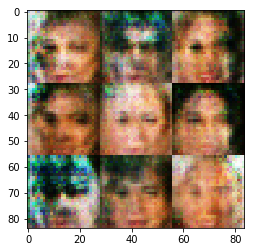

Epoch 1/1... Discriminator Loss: 1.6957... Generator Loss: 0.3330


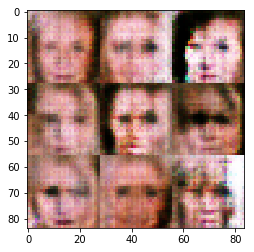

Epoch 1/1... Discriminator Loss: 1.3289... Generator Loss: 0.6659


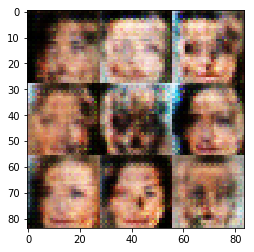

Epoch 1/1... Discriminator Loss: 1.4186... Generator Loss: 0.8412


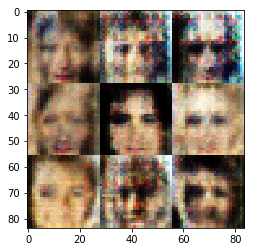

Epoch 1/1... Discriminator Loss: 1.4650... Generator Loss: 0.9842


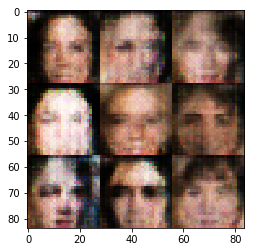

Epoch 1/1... Discriminator Loss: 1.3900... Generator Loss: 0.4597


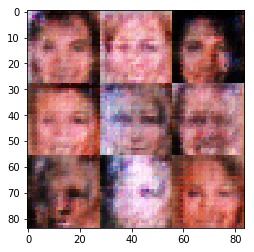

Epoch 1/1... Discriminator Loss: 1.5982... Generator Loss: 0.3971


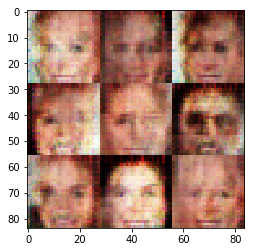

Epoch 1/1... Discriminator Loss: 1.5009... Generator Loss: 0.3406


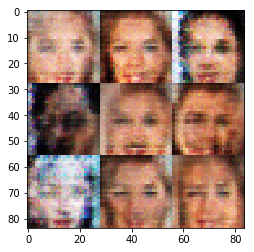

Epoch 1/1... Discriminator Loss: 1.4399... Generator Loss: 0.4498


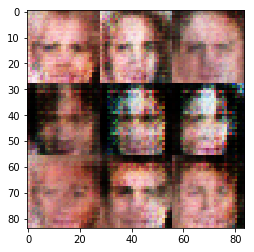

Epoch 1/1... Discriminator Loss: 1.4474... Generator Loss: 0.4788


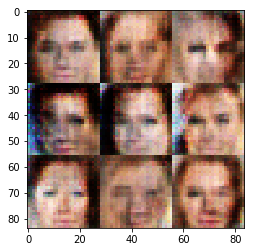

Epoch 1/1... Discriminator Loss: 1.2063... Generator Loss: 0.6839


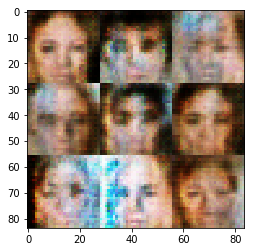

Epoch 1/1... Discriminator Loss: 1.2937... Generator Loss: 0.8147


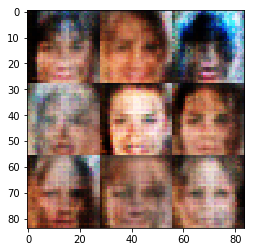

Epoch 1/1... Discriminator Loss: 1.3147... Generator Loss: 1.0855


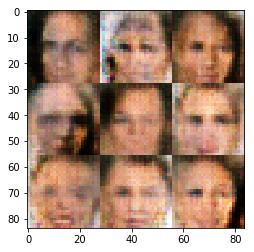

Epoch 1/1... Discriminator Loss: 1.3129... Generator Loss: 0.8363


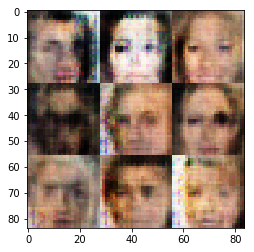

Epoch 1/1... Discriminator Loss: 1.3825... Generator Loss: 0.7370


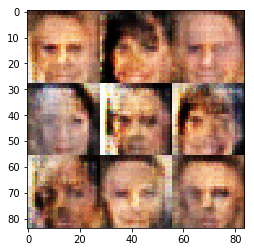

Epoch 1/1... Discriminator Loss: 1.7157... Generator Loss: 0.3519


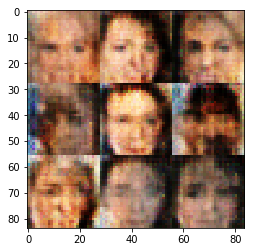

Epoch 1/1... Discriminator Loss: 1.4378... Generator Loss: 0.6472


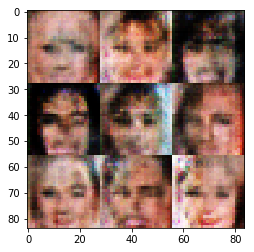

Epoch 1/1... Discriminator Loss: 1.3685... Generator Loss: 0.7952


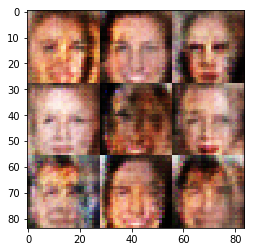

Epoch 1/1... Discriminator Loss: 1.4955... Generator Loss: 1.1318


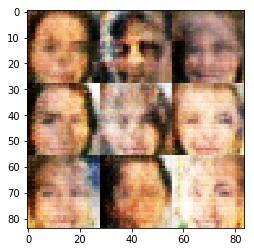

Epoch 1/1... Discriminator Loss: 1.4122... Generator Loss: 0.9977


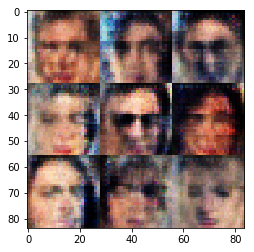

Epoch 1/1... Discriminator Loss: 1.2365... Generator Loss: 0.5816


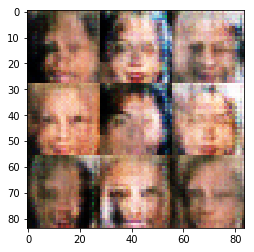

Epoch 1/1... Discriminator Loss: 1.3665... Generator Loss: 0.6772


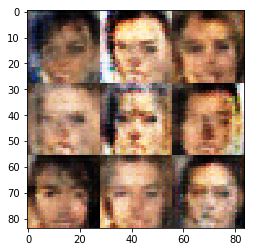

Epoch 1/1... Discriminator Loss: 1.4399... Generator Loss: 0.5214


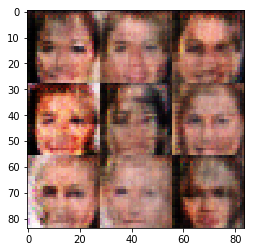

Epoch 1/1... Discriminator Loss: 1.5366... Generator Loss: 1.0919


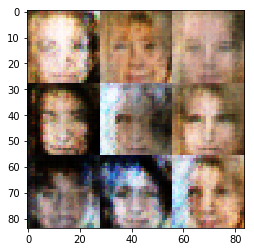

Epoch 1/1... Discriminator Loss: 1.4961... Generator Loss: 0.5531


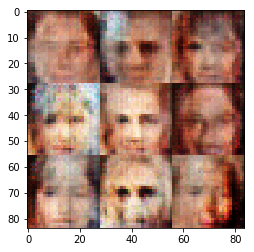

Epoch 1/1... Discriminator Loss: 1.3647... Generator Loss: 0.5328


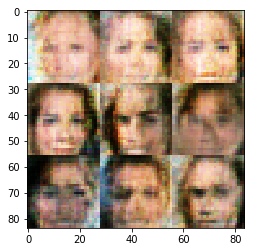

Epoch 1/1... Discriminator Loss: 1.5270... Generator Loss: 1.1405


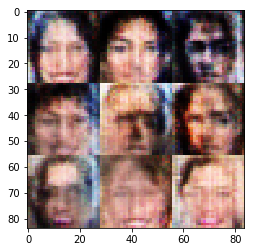

Epoch 1/1... Discriminator Loss: 1.4983... Generator Loss: 0.4989


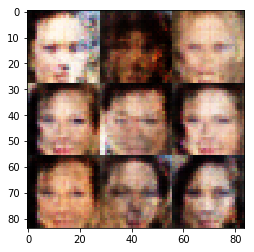

Epoch 1/1... Discriminator Loss: 1.4409... Generator Loss: 0.6533


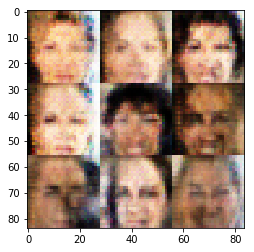

Epoch 1/1... Discriminator Loss: 1.3597... Generator Loss: 0.6036


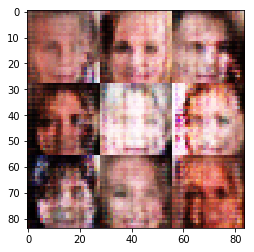

Epoch 1/1... Discriminator Loss: 1.4773... Generator Loss: 0.6607


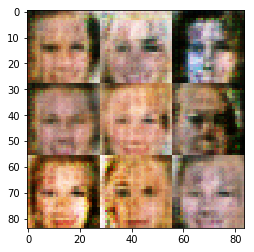

Epoch 1/1... Discriminator Loss: 1.5177... Generator Loss: 0.8216


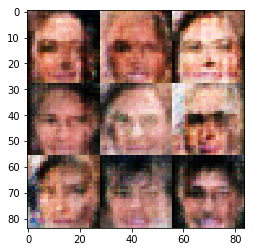

Epoch 1/1... Discriminator Loss: 1.4552... Generator Loss: 0.6149


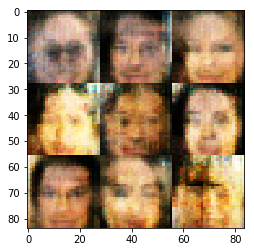

Epoch 1/1... Discriminator Loss: 1.3314... Generator Loss: 0.6211


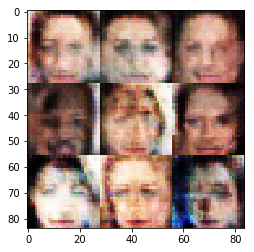

Epoch 1/1... Discriminator Loss: 1.4317... Generator Loss: 0.5958


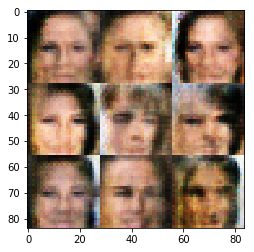

Epoch 1/1... Discriminator Loss: 1.3588... Generator Loss: 0.7247


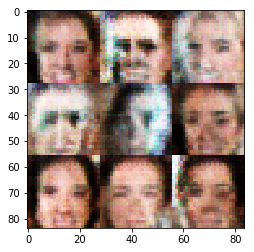

Epoch 1/1... Discriminator Loss: 1.3796... Generator Loss: 0.6392


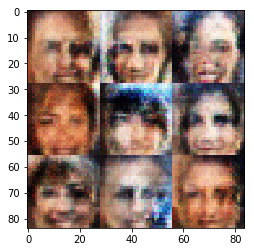

Epoch 1/1... Discriminator Loss: 1.5665... Generator Loss: 0.4057


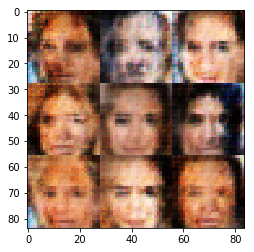

Epoch 1/1... Discriminator Loss: 1.5512... Generator Loss: 0.3705


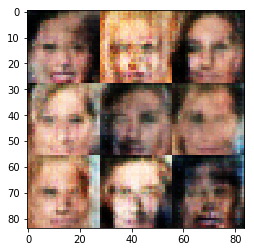

Epoch 1/1... Discriminator Loss: 2.0509... Generator Loss: 1.7005


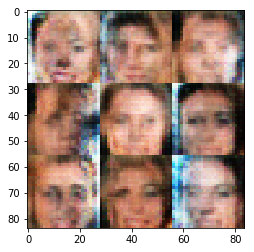

Epoch 1/1... Discriminator Loss: 1.0237... Generator Loss: 0.7695


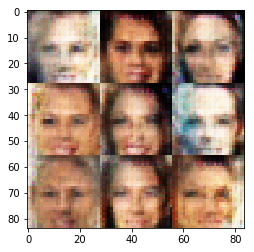

Epoch 1/1... Discriminator Loss: 1.4101... Generator Loss: 0.7641


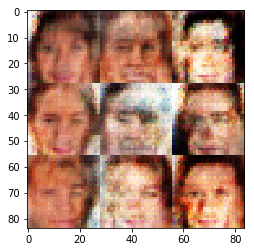

Epoch 1/1... Discriminator Loss: 1.3350... Generator Loss: 0.7165


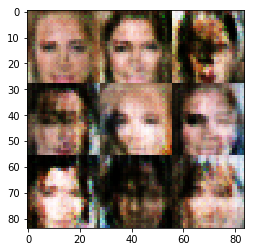

Epoch 1/1... Discriminator Loss: 1.4378... Generator Loss: 0.7340


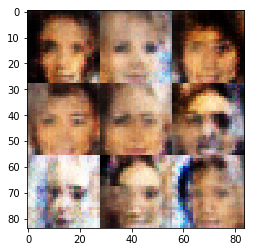

Epoch 1/1... Discriminator Loss: 1.6475... Generator Loss: 0.3062


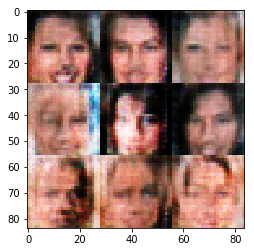

Epoch 1/1... Discriminator Loss: 1.3490... Generator Loss: 0.7137


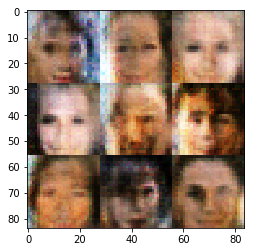

Epoch 1/1... Discriminator Loss: 1.5972... Generator Loss: 1.3505


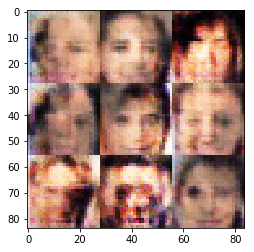

Epoch 1/1... Discriminator Loss: 1.2914... Generator Loss: 0.5721


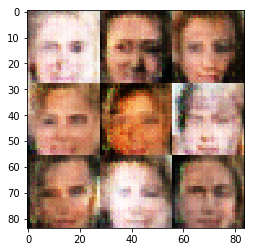

Epoch 1/1... Discriminator Loss: 1.6153... Generator Loss: 1.2080


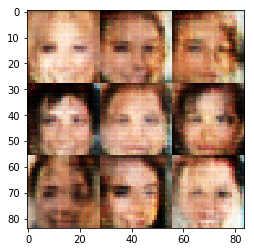

Epoch 1/1... Discriminator Loss: 1.3234... Generator Loss: 0.7806


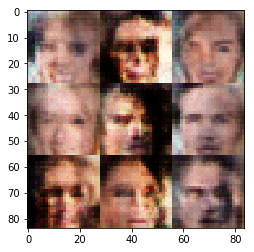

Epoch 1/1... Discriminator Loss: 1.2896... Generator Loss: 0.8151


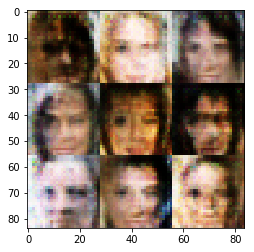

Epoch 1/1... Discriminator Loss: 1.1346... Generator Loss: 0.8132


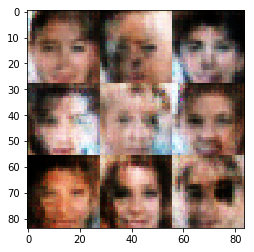

Epoch 1/1... Discriminator Loss: 1.4181... Generator Loss: 0.5021


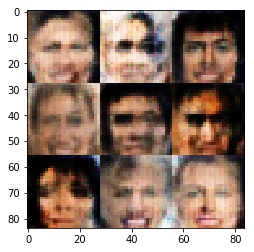

Epoch 1/1... Discriminator Loss: 1.3760... Generator Loss: 0.6511


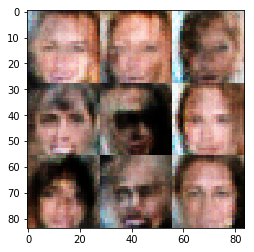

Epoch 1/1... Discriminator Loss: 1.4585... Generator Loss: 0.4395


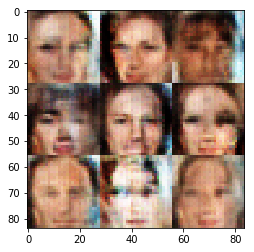

Epoch 1/1... Discriminator Loss: 1.2830... Generator Loss: 0.6524


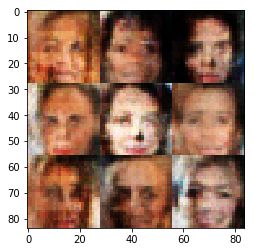

Epoch 1/1... Discriminator Loss: 1.6575... Generator Loss: 0.3419


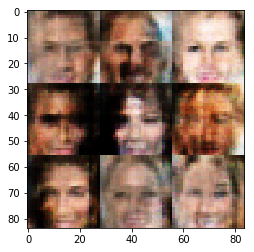

Epoch 1/1... Discriminator Loss: 1.4992... Generator Loss: 0.4631


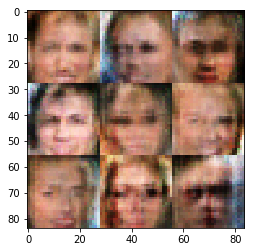

Epoch 1/1... Discriminator Loss: 1.2485... Generator Loss: 0.5797


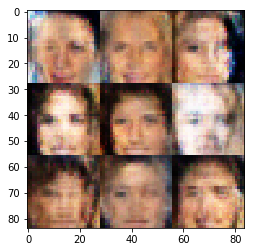

Epoch 1/1... Discriminator Loss: 1.3629... Generator Loss: 0.9064


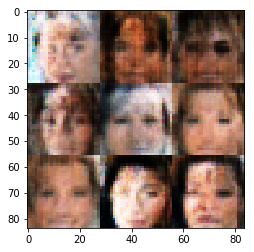

Epoch 1/1... Discriminator Loss: 1.3876... Generator Loss: 0.5201


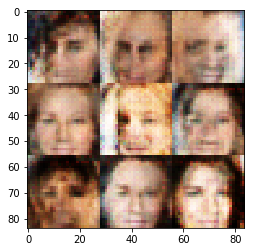

Epoch 1/1... Discriminator Loss: 1.8051... Generator Loss: 0.2906


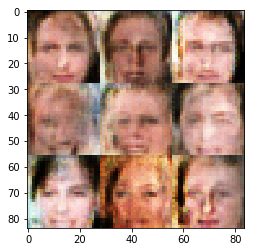

Epoch 1/1... Discriminator Loss: 1.3909... Generator Loss: 0.6491


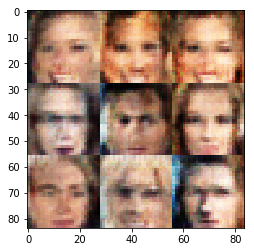

Epoch 1/1... Discriminator Loss: 1.4016... Generator Loss: 1.1153


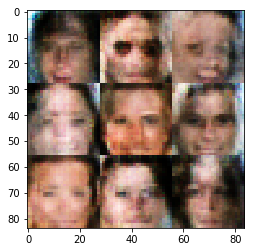

Epoch 1/1... Discriminator Loss: 1.3395... Generator Loss: 0.7119


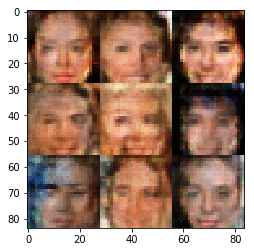

Epoch 1/1... Discriminator Loss: 1.3579... Generator Loss: 0.5829


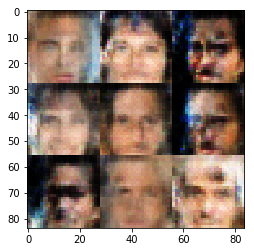

Epoch 1/1... Discriminator Loss: 1.2029... Generator Loss: 0.6755


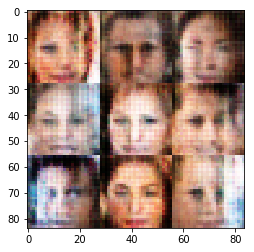

Epoch 1/1... Discriminator Loss: 1.2506... Generator Loss: 0.6967


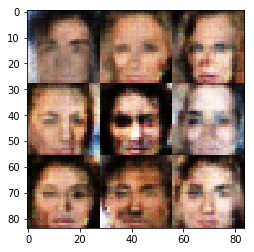

Epoch 1/1... Discriminator Loss: 1.1855... Generator Loss: 0.7077


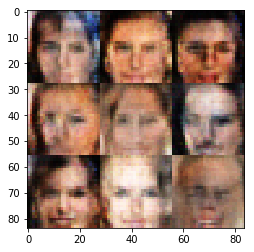

Epoch 1/1... Discriminator Loss: 1.3360... Generator Loss: 0.5717


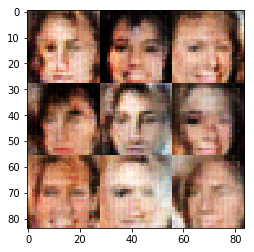

Epoch 1/1... Discriminator Loss: 1.4216... Generator Loss: 1.1415


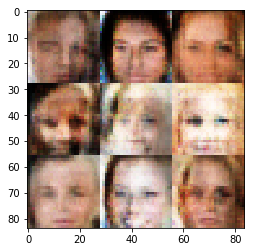

Epoch 1/1... Discriminator Loss: 1.3387... Generator Loss: 0.4773


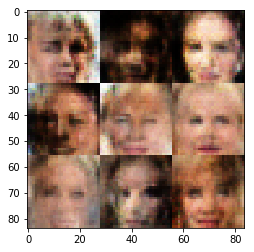

Epoch 1/1... Discriminator Loss: 1.5168... Generator Loss: 0.4919


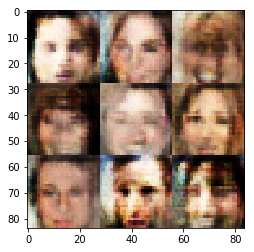

Epoch 1/1... Discriminator Loss: 1.2490... Generator Loss: 0.5944


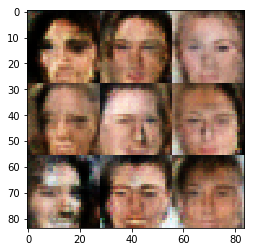

Epoch 1/1... Discriminator Loss: 1.5874... Generator Loss: 0.3878


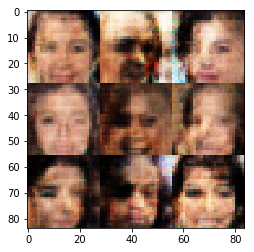

Epoch 1/1... Discriminator Loss: 1.5007... Generator Loss: 0.8383


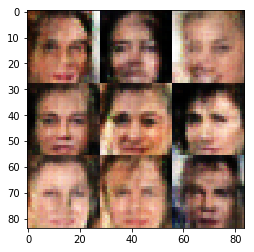

Epoch 1/1... Discriminator Loss: 1.1398... Generator Loss: 0.6147


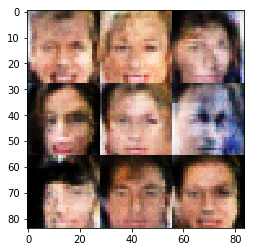

Epoch 1/1... Discriminator Loss: 1.3162... Generator Loss: 0.5765


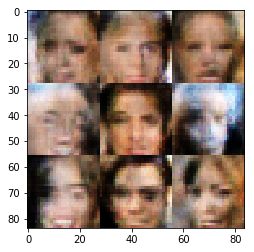

Epoch 1/1... Discriminator Loss: 1.2966... Generator Loss: 0.7242


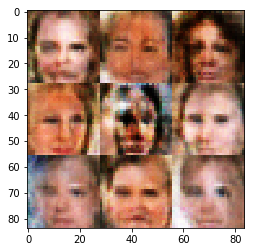

Epoch 1/1... Discriminator Loss: 1.3978... Generator Loss: 0.7151


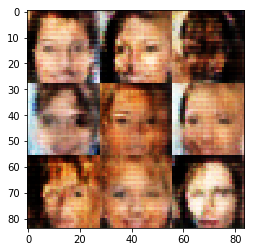

Epoch 1/1... Discriminator Loss: 1.2763... Generator Loss: 0.6455


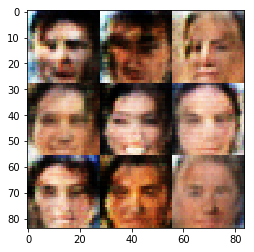

Epoch 1/1... Discriminator Loss: 1.3314... Generator Loss: 0.9702


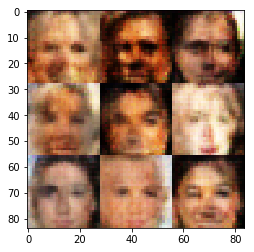

Epoch 1/1... Discriminator Loss: 1.1998... Generator Loss: 0.6752


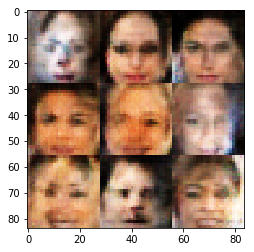

Epoch 1/1... Discriminator Loss: 1.3060... Generator Loss: 0.6747


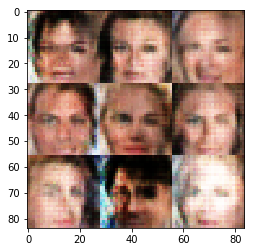

Epoch 1/1... Discriminator Loss: 1.4865... Generator Loss: 0.3546


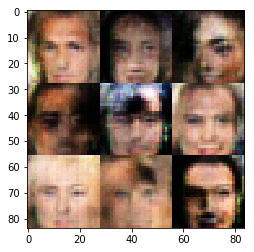

Epoch 1/1... Discriminator Loss: 1.3294... Generator Loss: 0.6883


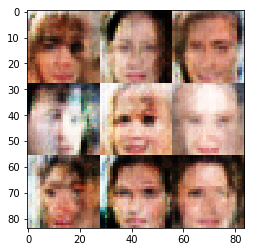

Epoch 1/1... Discriminator Loss: 1.5154... Generator Loss: 0.3669


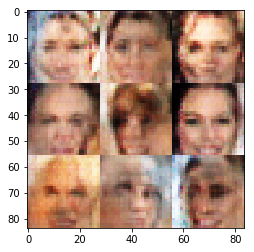

Epoch 1/1... Discriminator Loss: 1.3306... Generator Loss: 0.7272


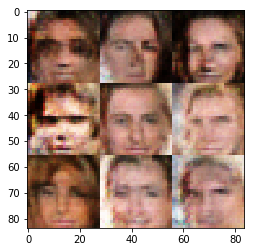

Epoch 1/1... Discriminator Loss: 1.5156... Generator Loss: 0.5895


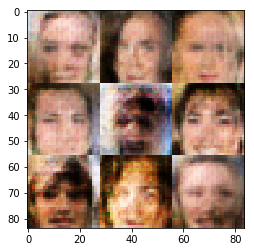

Epoch 1/1... Discriminator Loss: 1.3539... Generator Loss: 0.9765


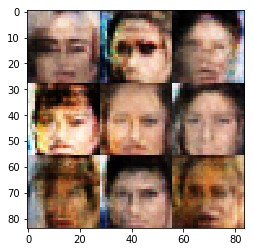

Epoch 1/1... Discriminator Loss: 1.3825... Generator Loss: 0.6750


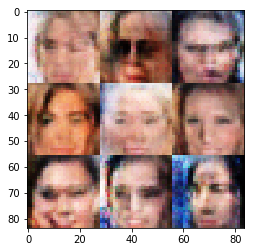

Epoch 1/1... Discriminator Loss: 1.3430... Generator Loss: 0.5184


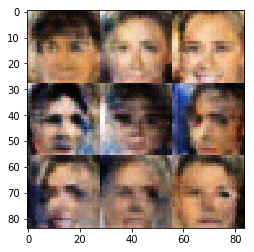

Epoch 1/1... Discriminator Loss: 1.3378... Generator Loss: 0.6707


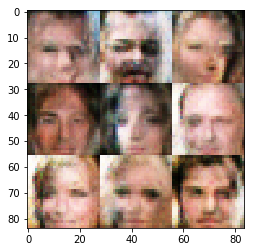

Epoch 1/1... Discriminator Loss: 1.3613... Generator Loss: 0.4832


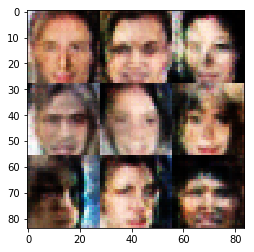

Epoch 1/1... Discriminator Loss: 1.3647... Generator Loss: 1.0373


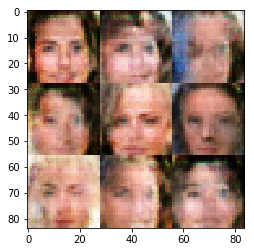

Epoch 1/1... Discriminator Loss: 1.2211... Generator Loss: 0.9101


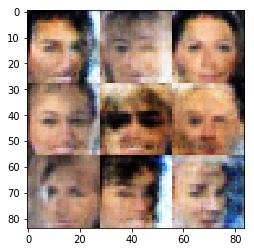

Epoch 1/1... Discriminator Loss: 1.2819... Generator Loss: 0.6640


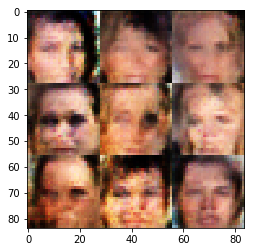

Epoch 1/1... Discriminator Loss: 1.2798... Generator Loss: 0.7274


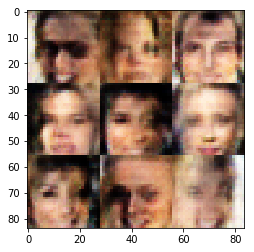

Epoch 1/1... Discriminator Loss: 1.4357... Generator Loss: 0.6371


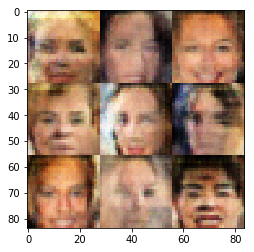

Epoch 1/1... Discriminator Loss: 1.2320... Generator Loss: 0.6891


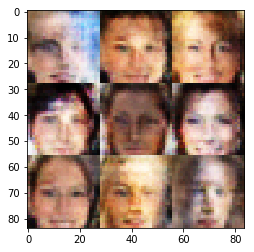

Epoch 1/1... Discriminator Loss: 1.2044... Generator Loss: 0.8929


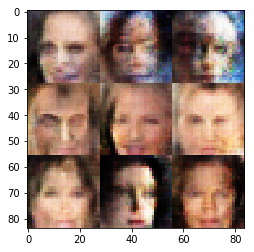

Epoch 1/1... Discriminator Loss: 1.3368... Generator Loss: 0.6096


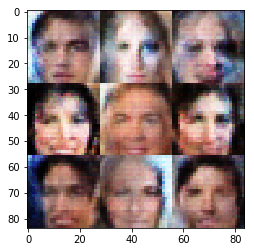

Epoch 1/1... Discriminator Loss: 1.3370... Generator Loss: 0.5111


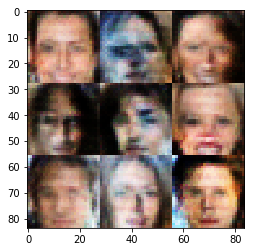

Epoch 1/1... Discriminator Loss: 1.3394... Generator Loss: 0.8347


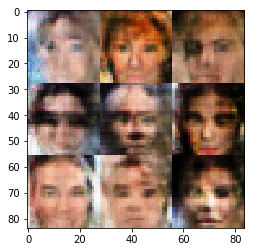

Epoch 1/1... Discriminator Loss: 1.3258... Generator Loss: 0.6600


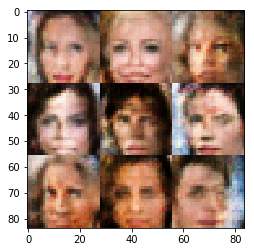

Epoch 1/1... Discriminator Loss: 1.3628... Generator Loss: 0.8113


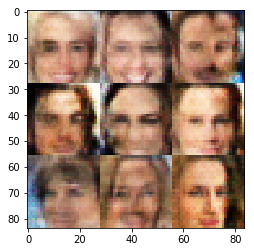

Epoch 1/1... Discriminator Loss: 1.3552... Generator Loss: 0.5991


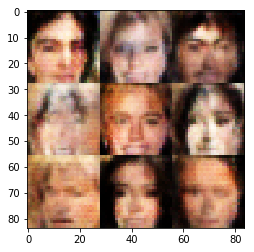

Epoch 1/1... Discriminator Loss: 1.2618... Generator Loss: 0.5553


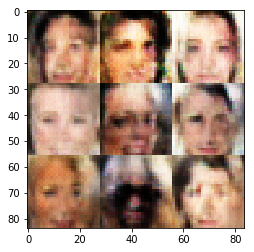

Epoch 1/1... Discriminator Loss: 1.6689... Generator Loss: 0.3240


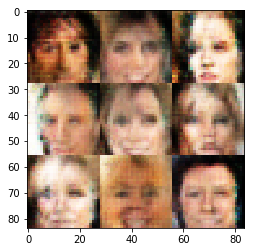

Epoch 1/1... Discriminator Loss: 1.2775... Generator Loss: 0.6147


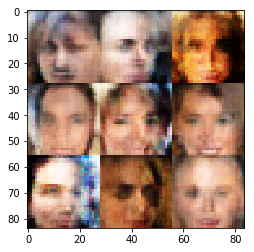

Epoch 1/1... Discriminator Loss: 1.4296... Generator Loss: 0.9333


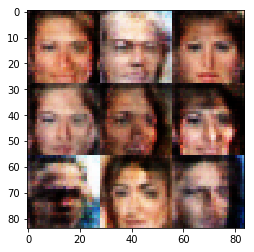

Epoch 1/1... Discriminator Loss: 1.4250... Generator Loss: 0.6244


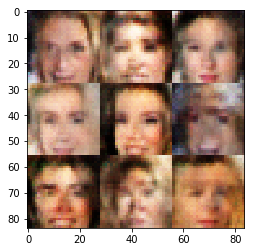

Epoch 1/1... Discriminator Loss: 1.3090... Generator Loss: 0.6260


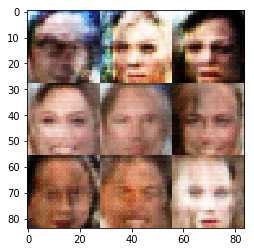

Epoch 1/1... Discriminator Loss: 1.1270... Generator Loss: 0.8509


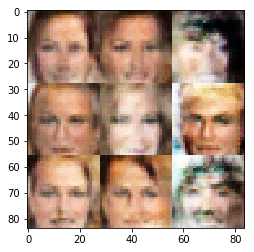

Epoch 1/1... Discriminator Loss: 1.4434... Generator Loss: 0.4831


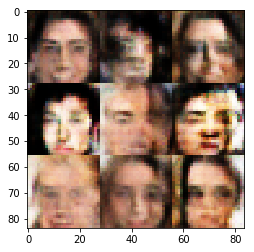

Epoch 1/1... Discriminator Loss: 1.2610... Generator Loss: 0.5912


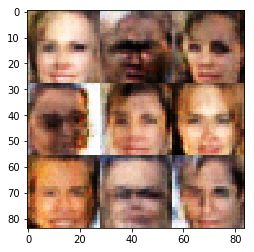

Epoch 1/1... Discriminator Loss: 1.2944... Generator Loss: 0.6134


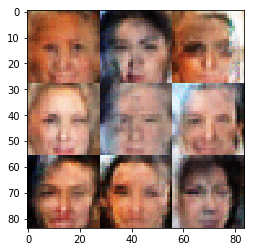

Epoch 1/1... Discriminator Loss: 1.3363... Generator Loss: 0.8384


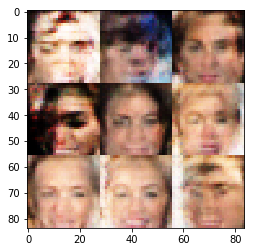

Epoch 1/1... Discriminator Loss: 1.2788... Generator Loss: 0.5984


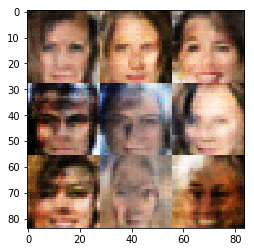

Epoch 1/1... Discriminator Loss: 1.2886... Generator Loss: 0.6871


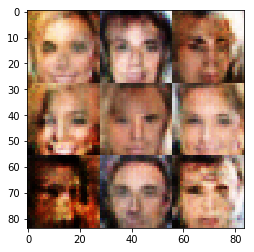

Epoch 1/1... Discriminator Loss: 1.2584... Generator Loss: 0.7689


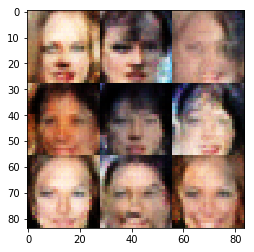

Epoch 1/1... Discriminator Loss: 1.2624... Generator Loss: 0.5934


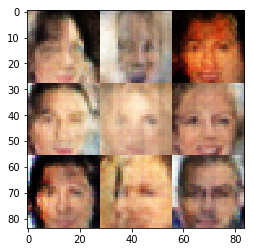

Epoch 1/1... Discriminator Loss: 1.4146... Generator Loss: 0.7290


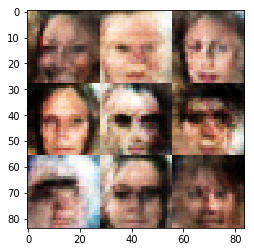

Epoch 1/1... Discriminator Loss: 1.2611... Generator Loss: 0.8244


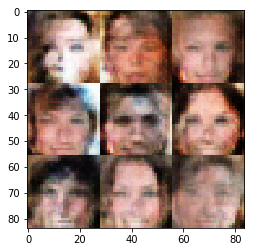

Epoch 1/1... Discriminator Loss: 1.2639... Generator Loss: 0.7735


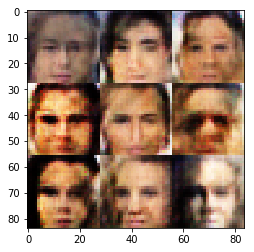

Epoch 1/1... Discriminator Loss: 1.2739... Generator Loss: 0.7614


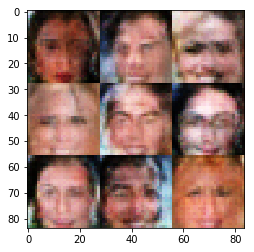

Epoch 1/1... Discriminator Loss: 1.6837... Generator Loss: 0.6238


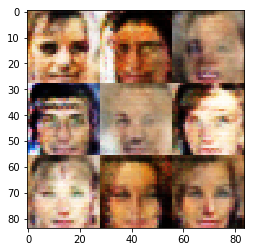

Epoch 1/1... Discriminator Loss: 1.2260... Generator Loss: 0.7896


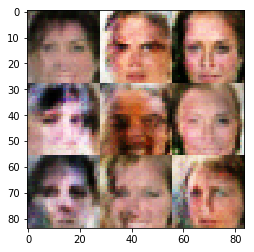

Epoch 1/1... Discriminator Loss: 1.3309... Generator Loss: 0.5803


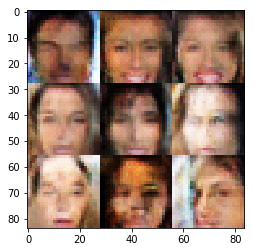

Epoch 1/1... Discriminator Loss: 1.5003... Generator Loss: 0.4048


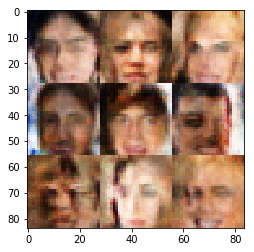

Epoch 1/1... Discriminator Loss: 1.3423... Generator Loss: 0.6421


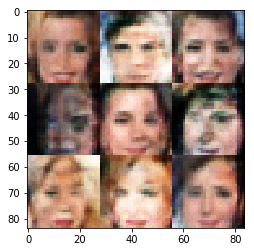

Epoch 1/1... Discriminator Loss: 1.3095... Generator Loss: 0.7661


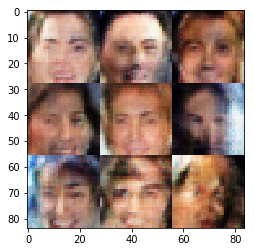

Epoch 1/1... Discriminator Loss: 1.3452... Generator Loss: 0.4389


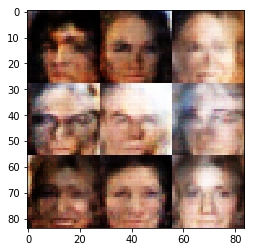

Epoch 1/1... Discriminator Loss: 1.2982... Generator Loss: 0.7977


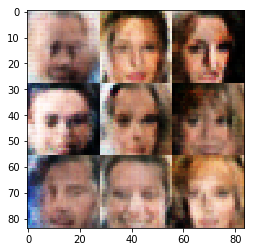

Epoch 1/1... Discriminator Loss: 1.2283... Generator Loss: 0.6851


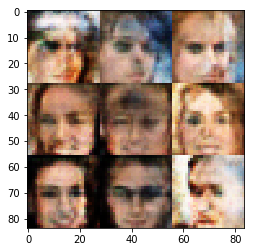

Epoch 1/1... Discriminator Loss: 1.3199... Generator Loss: 0.5435


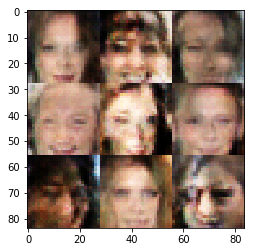

Epoch 1/1... Discriminator Loss: 1.3037... Generator Loss: 0.5254


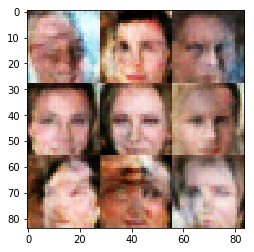

Epoch 1/1... Discriminator Loss: 1.2338... Generator Loss: 1.1662


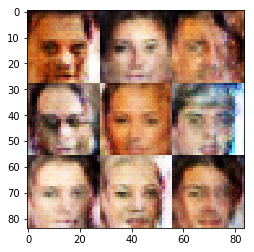

Epoch 1/1... Discriminator Loss: 1.2843... Generator Loss: 0.8468


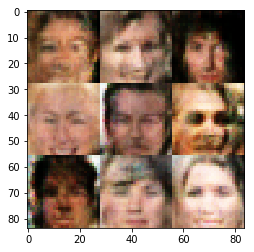

Epoch 1/1... Discriminator Loss: 1.1797... Generator Loss: 0.6333


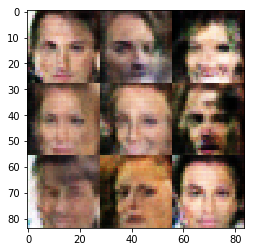

Epoch 1/1... Discriminator Loss: 1.3629... Generator Loss: 0.4872


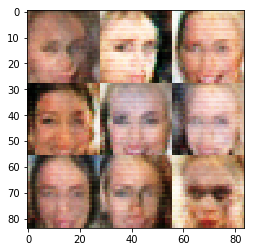

Epoch 1/1... Discriminator Loss: 1.2586... Generator Loss: 0.9393


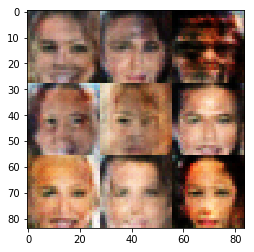

Epoch 1/1... Discriminator Loss: 1.2119... Generator Loss: 0.7444


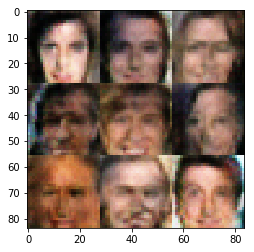

Epoch 1/1... Discriminator Loss: 1.3529... Generator Loss: 0.4725


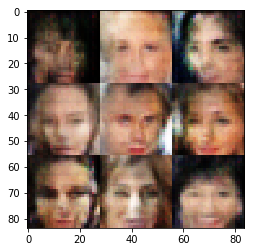

Epoch 1/1... Discriminator Loss: 1.4000... Generator Loss: 0.9237


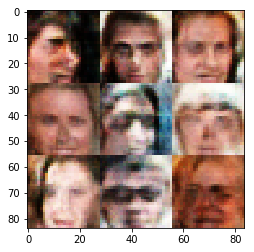

Epoch 1/1... Discriminator Loss: 1.3005... Generator Loss: 0.5648


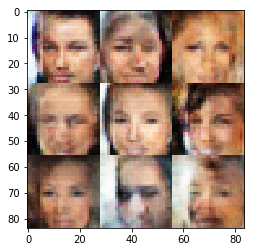

Epoch 1/1... Discriminator Loss: 1.1961... Generator Loss: 0.8509


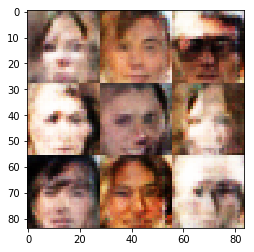

Epoch 1/1... Discriminator Loss: 1.3347... Generator Loss: 0.6428


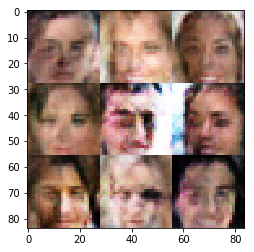

Epoch 1/1... Discriminator Loss: 1.2708... Generator Loss: 0.5785


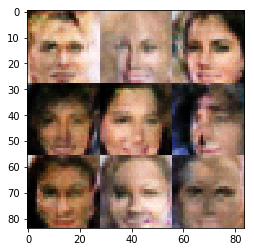

Epoch 1/1... Discriminator Loss: 1.3315... Generator Loss: 0.9954


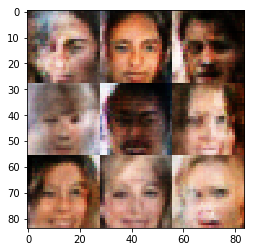

Epoch 1/1... Discriminator Loss: 1.2751... Generator Loss: 0.6554


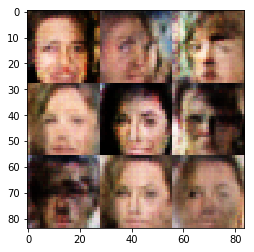

Epoch 1/1... Discriminator Loss: 1.2899... Generator Loss: 0.9718


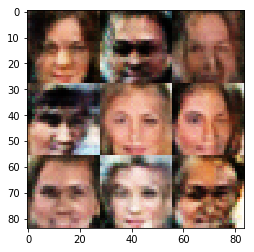

Epoch 1/1... Discriminator Loss: 1.4315... Generator Loss: 1.1819


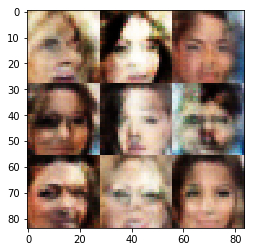

Epoch 1/1... Discriminator Loss: 1.2435... Generator Loss: 0.7191


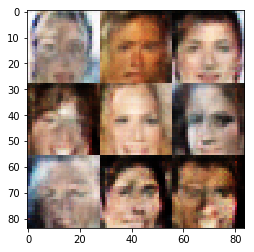

Epoch 1/1... Discriminator Loss: 1.1349... Generator Loss: 0.7386


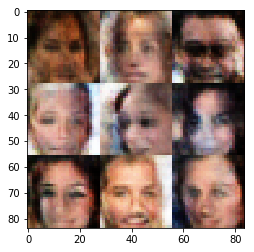

Epoch 1/1... Discriminator Loss: 1.0794... Generator Loss: 0.9222


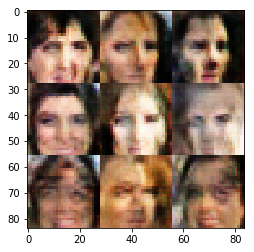

Epoch 1/1... Discriminator Loss: 1.7457... Generator Loss: 1.3782


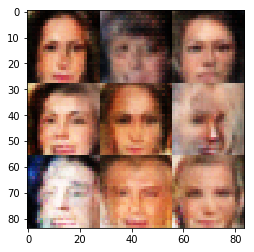

Epoch 1/1... Discriminator Loss: 1.3936... Generator Loss: 0.4354


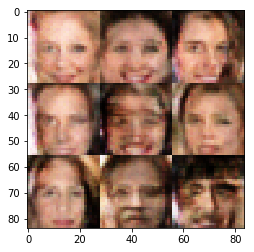

Epoch 1/1... Discriminator Loss: 1.0792... Generator Loss: 0.7584


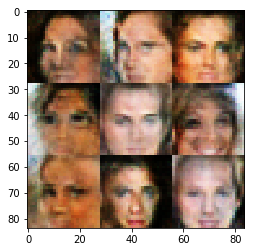

Epoch 1/1... Discriminator Loss: 1.2345... Generator Loss: 0.8001


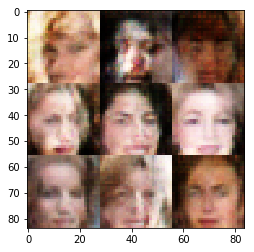

Epoch 1/1... Discriminator Loss: 1.4111... Generator Loss: 0.7015


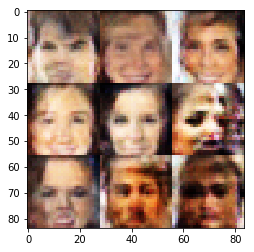

Epoch 1/1... Discriminator Loss: 1.2885... Generator Loss: 1.1498


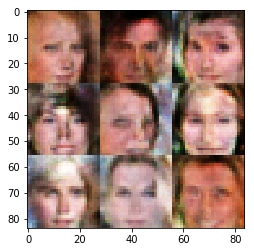

Epoch 1/1... Discriminator Loss: 1.5967... Generator Loss: 0.4066


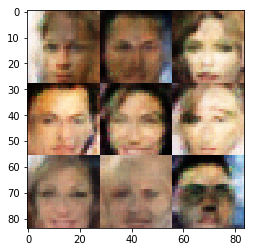

Epoch 1/1... Discriminator Loss: 1.2580... Generator Loss: 0.6628


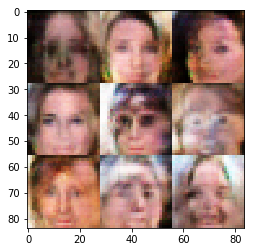

Epoch 1/1... Discriminator Loss: 1.7267... Generator Loss: 1.5435


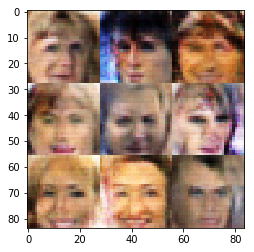

Epoch 1/1... Discriminator Loss: 1.3277... Generator Loss: 0.8514


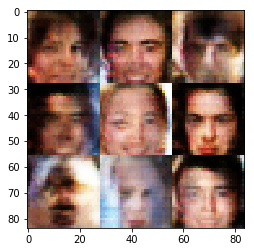

Epoch 1/1... Discriminator Loss: 1.4752... Generator Loss: 0.5457


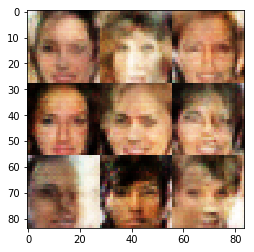

Epoch 1/1... Discriminator Loss: 1.2439... Generator Loss: 0.7748


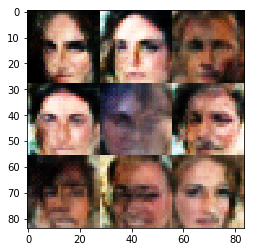

Epoch 1/1... Discriminator Loss: 1.2704... Generator Loss: 0.8264


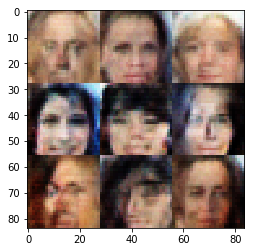

Epoch 1/1... Discriminator Loss: 1.3922... Generator Loss: 0.4966


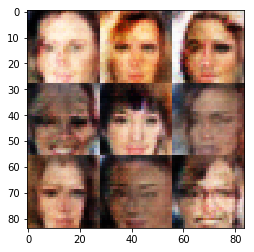

Epoch 1/1... Discriminator Loss: 1.1780... Generator Loss: 0.7874


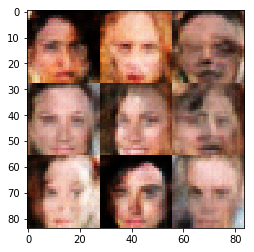

Epoch 1/1... Discriminator Loss: 1.4439... Generator Loss: 0.4886


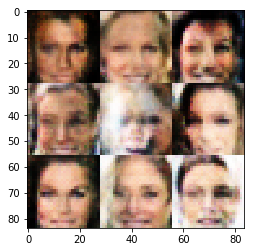

Epoch 1/1... Discriminator Loss: 1.2351... Generator Loss: 0.8557


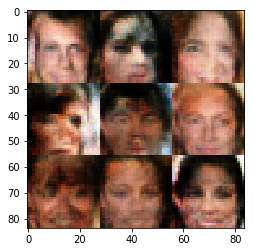

Epoch 1/1... Discriminator Loss: 1.2808... Generator Loss: 1.0590


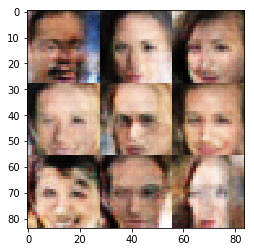

Epoch 1/1... Discriminator Loss: 1.3179... Generator Loss: 0.6007


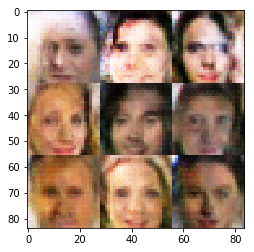

Epoch 1/1... Discriminator Loss: 1.2970... Generator Loss: 0.5011


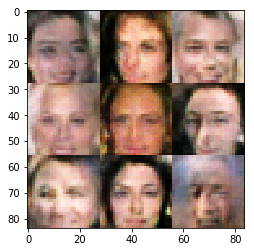

Epoch 1/1... Discriminator Loss: 1.3280... Generator Loss: 1.1949


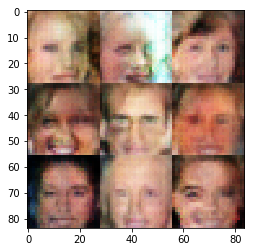

Epoch 1/1... Discriminator Loss: 1.3284... Generator Loss: 1.0379


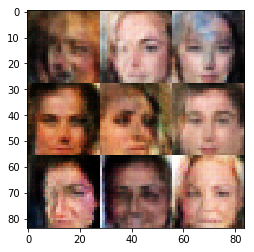

Epoch 1/1... Discriminator Loss: 1.2949... Generator Loss: 0.7204


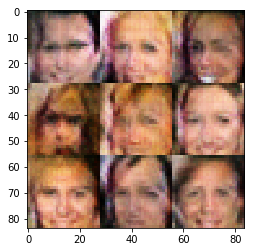

Epoch 1/1... Discriminator Loss: 1.3414... Generator Loss: 0.5459


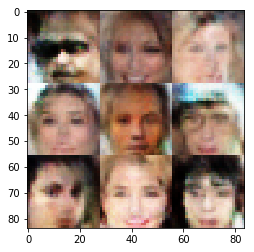

Epoch 1/1... Discriminator Loss: 1.7335... Generator Loss: 0.2961


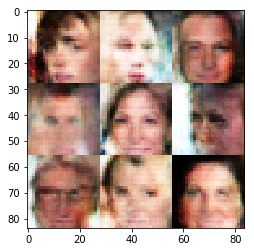

Epoch 1/1... Discriminator Loss: 1.2847... Generator Loss: 0.6318


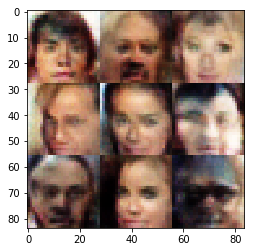

Epoch 1/1... Discriminator Loss: 1.4625... Generator Loss: 0.4066


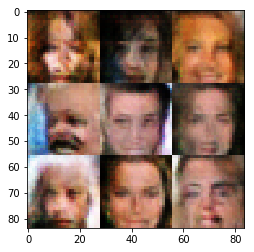

Epoch 1/1... Discriminator Loss: 1.3560... Generator Loss: 0.5224


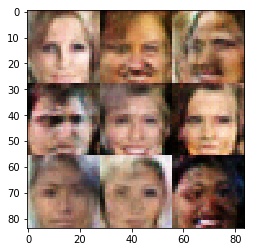

Epoch 1/1... Discriminator Loss: 1.4208... Generator Loss: 0.4600


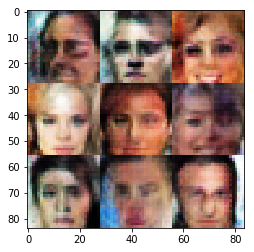

Epoch 1/1... Discriminator Loss: 1.6183... Generator Loss: 1.4658


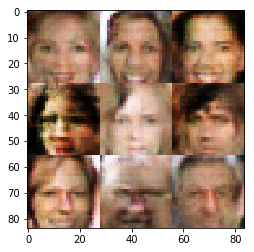

Epoch 1/1... Discriminator Loss: 1.3376... Generator Loss: 1.0918


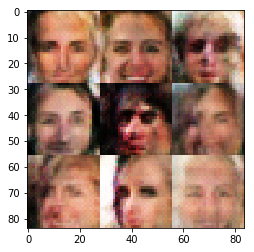

Epoch 1/1... Discriminator Loss: 1.4871... Generator Loss: 0.4005


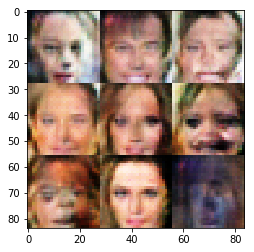

Epoch 1/1... Discriminator Loss: 1.3464... Generator Loss: 0.6354


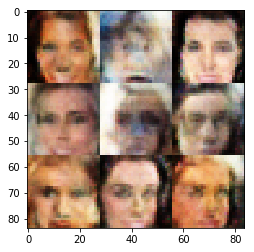

Epoch 1/1... Discriminator Loss: 1.6213... Generator Loss: 0.2969


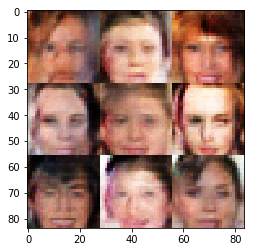

Epoch 1/1... Discriminator Loss: 1.1592... Generator Loss: 0.7161


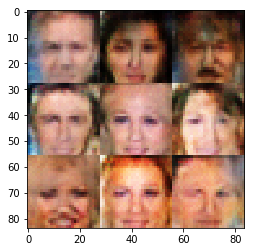

Epoch 1/1... Discriminator Loss: 1.3222... Generator Loss: 0.5587


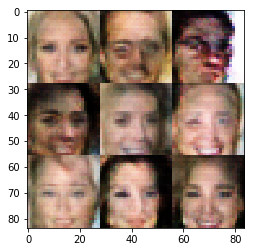

Epoch 1/1... Discriminator Loss: 1.5010... Generator Loss: 0.3876


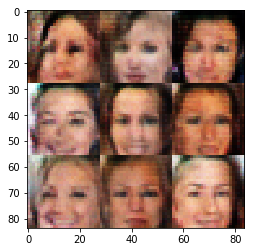

Epoch 1/1... Discriminator Loss: 1.1725... Generator Loss: 0.8481


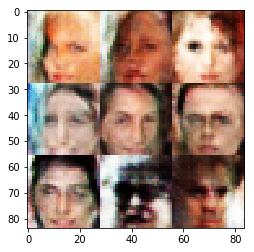

Epoch 1/1... Discriminator Loss: 1.2907... Generator Loss: 0.6300


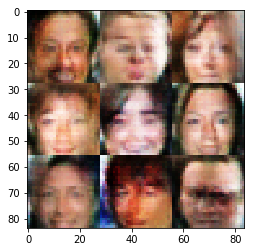

Epoch 1/1... Discriminator Loss: 1.2800... Generator Loss: 0.6031


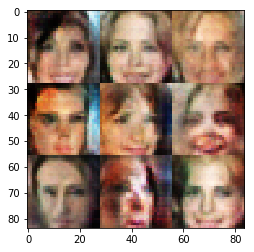

Epoch 1/1... Discriminator Loss: 1.9072... Generator Loss: 0.2380


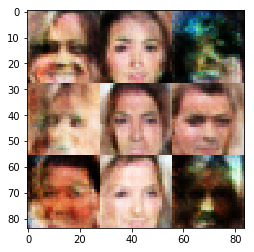

Epoch 1/1... Discriminator Loss: 1.2165... Generator Loss: 0.7128


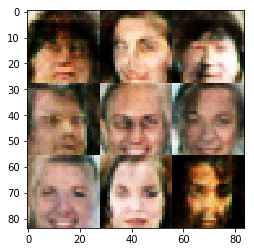

Epoch 1/1... Discriminator Loss: 1.3504... Generator Loss: 0.8551


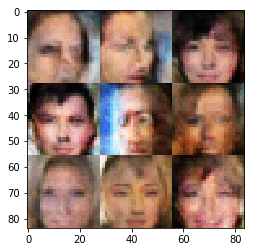

Epoch 1/1... Discriminator Loss: 1.4019... Generator Loss: 0.8578


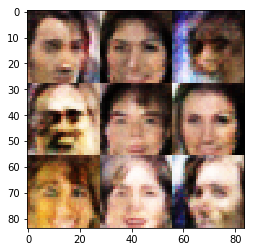

Epoch 1/1... Discriminator Loss: 1.2333... Generator Loss: 0.6618


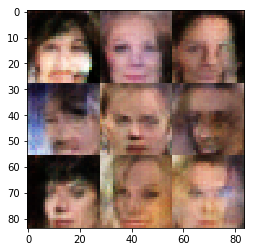

Epoch 1/1... Discriminator Loss: 1.2217... Generator Loss: 0.8454


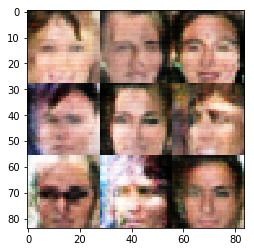

Epoch 1/1... Discriminator Loss: 1.4094... Generator Loss: 0.5848


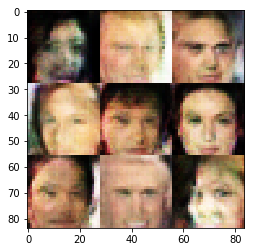

Epoch 1/1... Discriminator Loss: 1.4190... Generator Loss: 0.6267


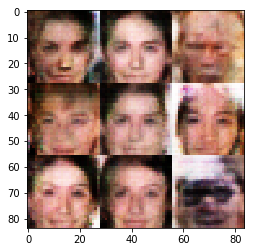

Epoch 1/1... Discriminator Loss: 1.3813... Generator Loss: 0.6912


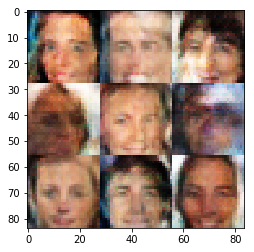

Epoch 1/1... Discriminator Loss: 1.2669... Generator Loss: 0.6230


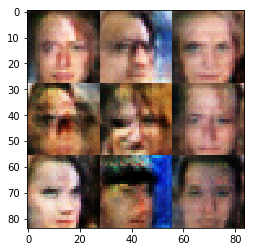

Epoch 1/1... Discriminator Loss: 1.3784... Generator Loss: 1.2101


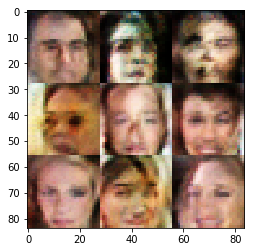

Epoch 1/1... Discriminator Loss: 1.2013... Generator Loss: 0.8889


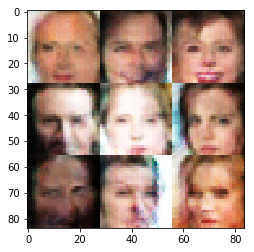

Epoch 1/1... Discriminator Loss: 1.2070... Generator Loss: 0.5862


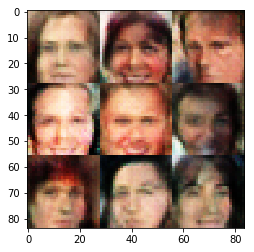

Epoch 1/1... Discriminator Loss: 1.4561... Generator Loss: 0.4487


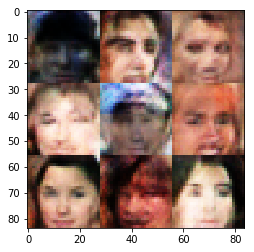

Epoch 1/1... Discriminator Loss: 1.4973... Generator Loss: 1.1458


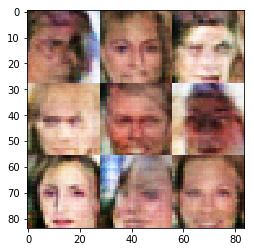

Epoch 1/1... Discriminator Loss: 1.3274... Generator Loss: 0.5166


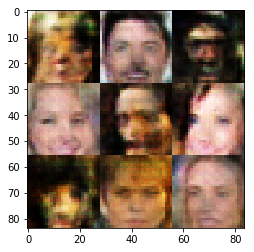

Epoch 1/1... Discriminator Loss: 1.7018... Generator Loss: 0.2858


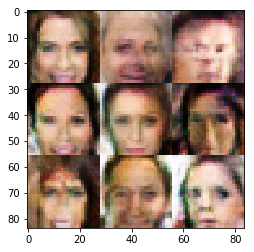

Epoch 1/1... Discriminator Loss: 1.2880... Generator Loss: 0.8447


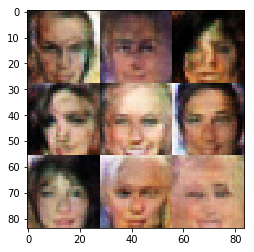

Epoch 1/1... Discriminator Loss: 1.2742... Generator Loss: 0.7087


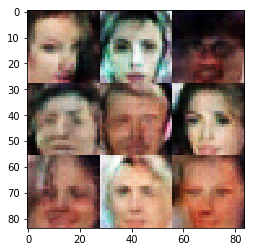

Epoch 1/1... Discriminator Loss: 1.2737... Generator Loss: 0.6260


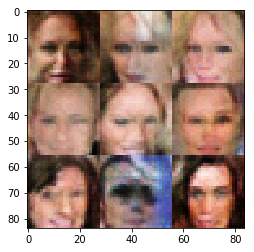

Epoch 1/1... Discriminator Loss: 1.1906... Generator Loss: 0.9248


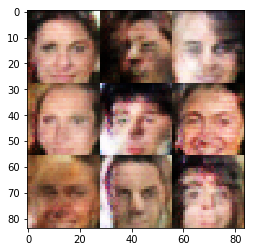

Epoch 1/1... Discriminator Loss: 1.3057... Generator Loss: 0.5137


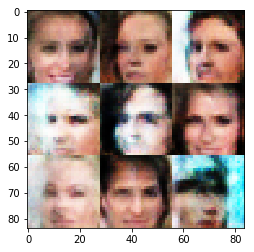

Epoch 1/1... Discriminator Loss: 1.1822... Generator Loss: 0.9196


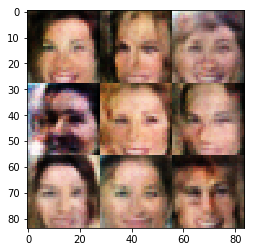

Epoch 1/1... Discriminator Loss: 1.2486... Generator Loss: 0.5518


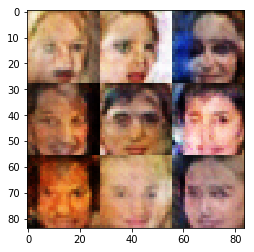

Epoch 1/1... Discriminator Loss: 1.5538... Generator Loss: 0.3590


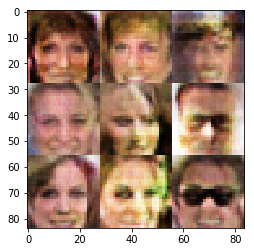

Epoch 1/1... Discriminator Loss: 1.3022... Generator Loss: 0.6410


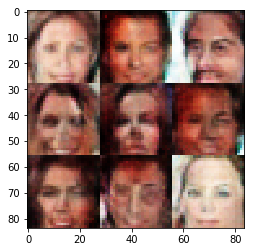

Epoch 1/1... Discriminator Loss: 1.3036... Generator Loss: 0.7208


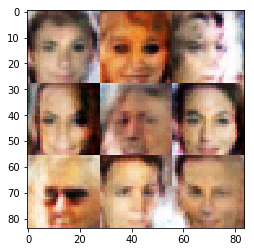

Epoch 1/1... Discriminator Loss: 1.1319... Generator Loss: 0.8940


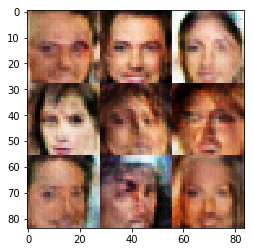

Epoch 1/1... Discriminator Loss: 1.3773... Generator Loss: 0.8244


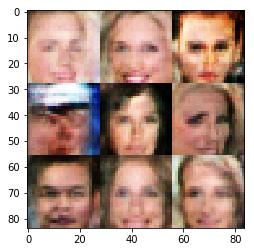

Epoch 1/1... Discriminator Loss: 1.2920... Generator Loss: 0.6431


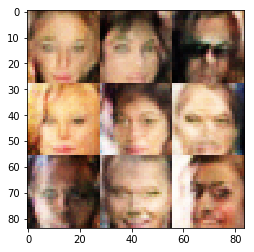

Epoch 1/1... Discriminator Loss: 1.3134... Generator Loss: 0.6904


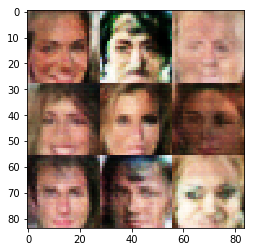

Epoch 1/1... Discriminator Loss: 1.3732... Generator Loss: 0.4511


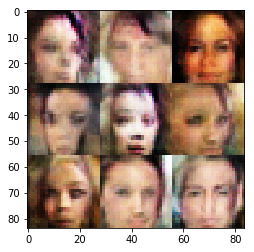

Epoch 1/1... Discriminator Loss: 1.3869... Generator Loss: 1.0080


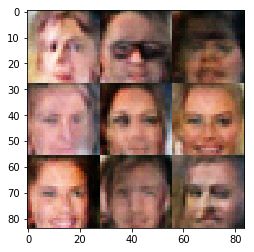

Epoch 1/1... Discriminator Loss: 1.2764... Generator Loss: 0.5101


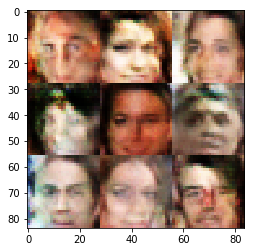

Epoch 1/1... Discriminator Loss: 1.2630... Generator Loss: 0.4891


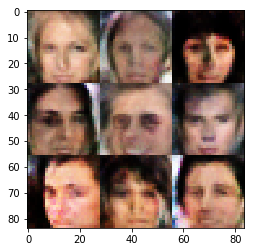

Epoch 1/1... Discriminator Loss: 1.2707... Generator Loss: 0.5789


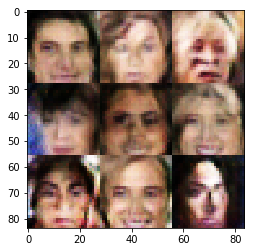

Epoch 1/1... Discriminator Loss: 1.4810... Generator Loss: 0.4010


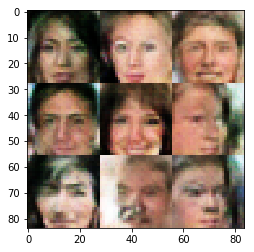

Epoch 1/1... Discriminator Loss: 1.4298... Generator Loss: 0.6742


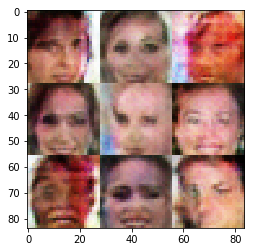

Epoch 1/1... Discriminator Loss: 1.3904... Generator Loss: 0.7099


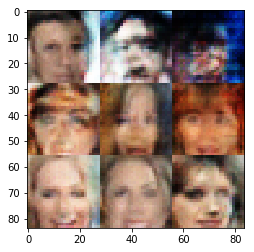

Epoch 1/1... Discriminator Loss: 1.3592... Generator Loss: 0.8036


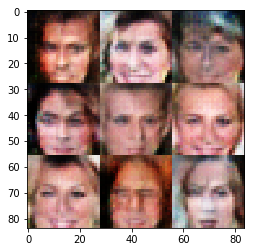

Epoch 1/1... Discriminator Loss: 1.3902... Generator Loss: 0.5549


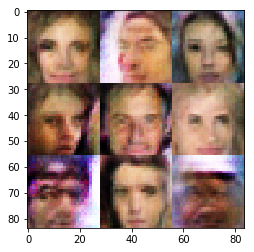

Epoch 1/1... Discriminator Loss: 1.3025... Generator Loss: 0.9099


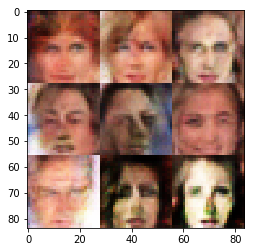

Epoch 1/1... Discriminator Loss: 1.3118... Generator Loss: 0.4727


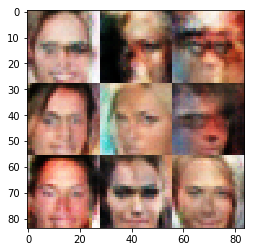

Epoch 1/1... Discriminator Loss: 1.3687... Generator Loss: 0.9565


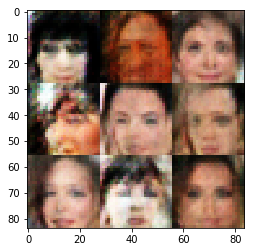

Epoch 1/1... Discriminator Loss: 1.4183... Generator Loss: 0.4229


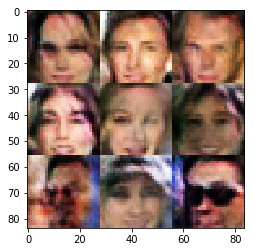

Epoch 1/1... Discriminator Loss: 1.3360... Generator Loss: 0.7776


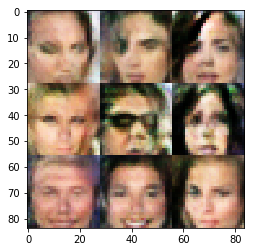

Epoch 1/1... Discriminator Loss: 1.2118... Generator Loss: 0.6156


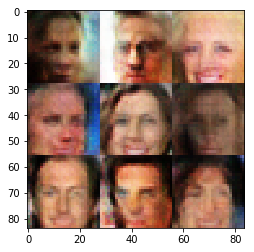

Epoch 1/1... Discriminator Loss: 1.8564... Generator Loss: 0.2290


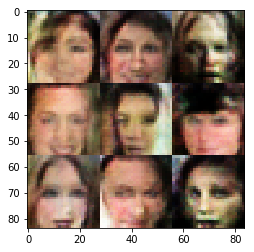

Epoch 1/1... Discriminator Loss: 1.2265... Generator Loss: 0.6673


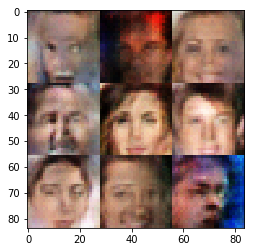

Epoch 1/1... Discriminator Loss: 1.7263... Generator Loss: 0.2839


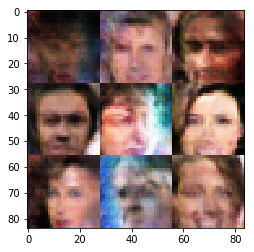

Epoch 1/1... Discriminator Loss: 1.3166... Generator Loss: 0.4456


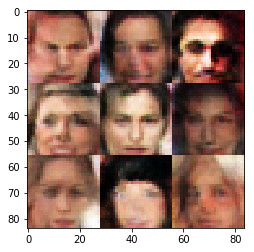

Epoch 1/1... Discriminator Loss: 1.1575... Generator Loss: 1.0558


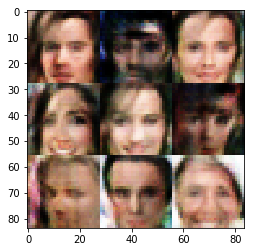

Epoch 1/1... Discriminator Loss: 1.1654... Generator Loss: 0.9864


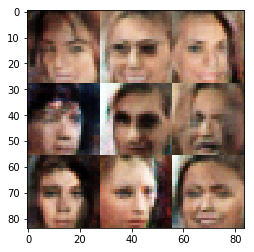

Epoch 1/1... Discriminator Loss: 1.4294... Generator Loss: 0.6142


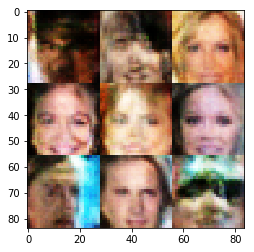

Epoch 1/1... Discriminator Loss: 1.2930... Generator Loss: 1.0420


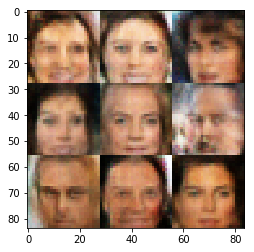

Epoch 1/1... Discriminator Loss: 1.5586... Generator Loss: 0.8775


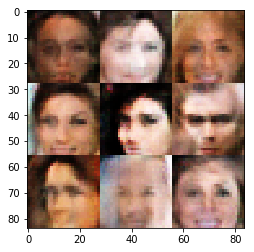

Epoch 1/1... Discriminator Loss: 1.4782... Generator Loss: 0.4013


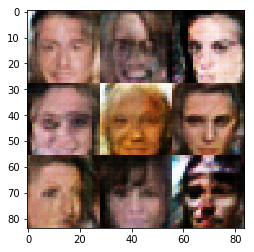

Epoch 1/1... Discriminator Loss: 1.2946... Generator Loss: 0.5507


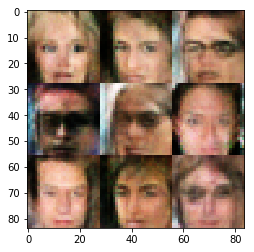

Epoch 1/1... Discriminator Loss: 1.2246... Generator Loss: 0.6828


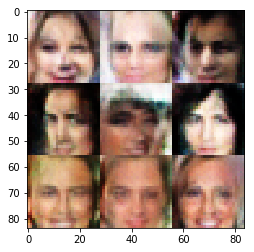

Epoch 1/1... Discriminator Loss: 1.3212... Generator Loss: 0.6736


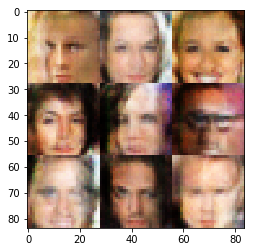

Epoch 1/1... Discriminator Loss: 1.2522... Generator Loss: 0.8813


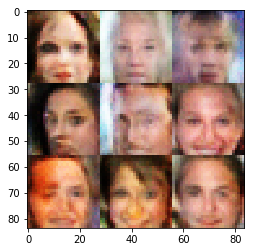

Epoch 1/1... Discriminator Loss: 1.3311... Generator Loss: 0.4776


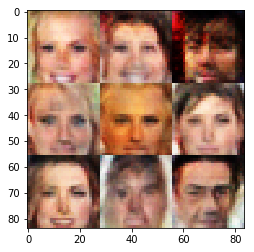

Epoch 1/1... Discriminator Loss: 1.1961... Generator Loss: 0.6933


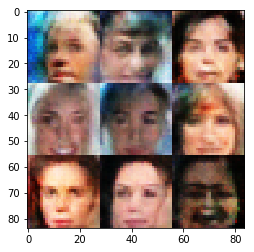

Epoch 1/1... Discriminator Loss: 1.6363... Generator Loss: 0.2872


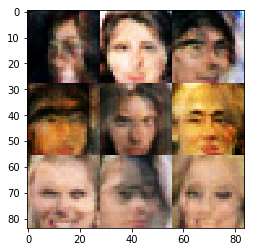

Epoch 1/1... Discriminator Loss: 1.7733... Generator Loss: 0.2375


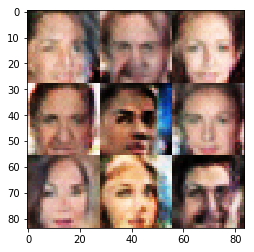

Epoch 1/1... Discriminator Loss: 1.3721... Generator Loss: 0.8189


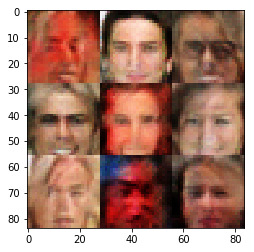

Epoch 1/1... Discriminator Loss: 1.3851... Generator Loss: 0.4649


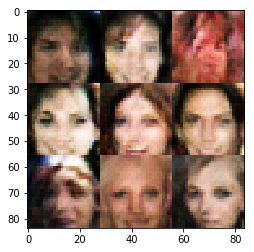

Epoch 1/1... Discriminator Loss: 1.2136... Generator Loss: 0.5695


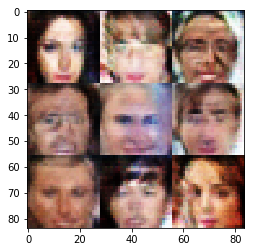

Epoch 1/1... Discriminator Loss: 1.1376... Generator Loss: 0.7492


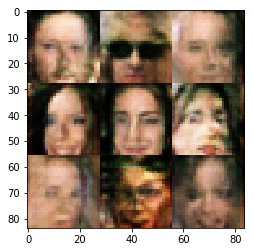

Epoch 1/1... Discriminator Loss: 1.2920... Generator Loss: 0.8424


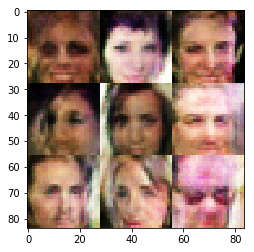

Epoch 1/1... Discriminator Loss: 1.4912... Generator Loss: 0.4329


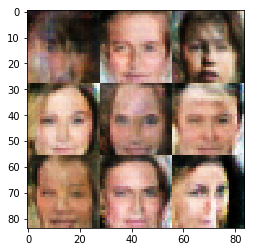

Epoch 1/1... Discriminator Loss: 1.5185... Generator Loss: 0.3539


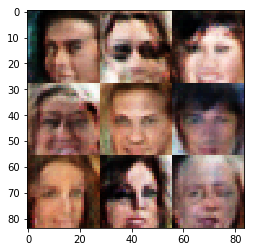

Epoch 1/1... Discriminator Loss: 1.3303... Generator Loss: 0.5138


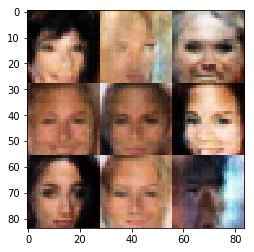

Epoch 1/1... Discriminator Loss: 1.1207... Generator Loss: 0.7909


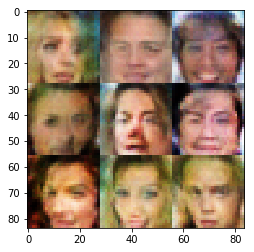

Epoch 1/1... Discriminator Loss: 1.1688... Generator Loss: 0.8165


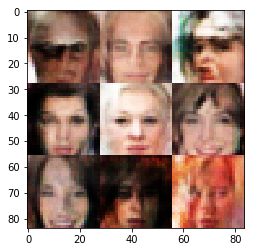

Epoch 1/1... Discriminator Loss: 1.2004... Generator Loss: 0.7961


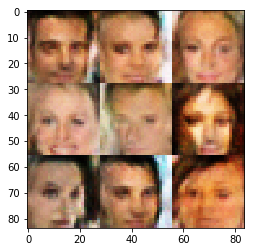

Epoch 1/1... Discriminator Loss: 1.4593... Generator Loss: 0.5852


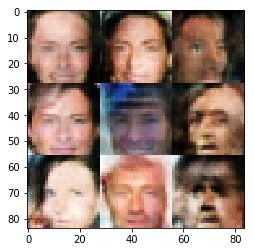

Epoch 1/1... Discriminator Loss: 1.2355... Generator Loss: 0.6364


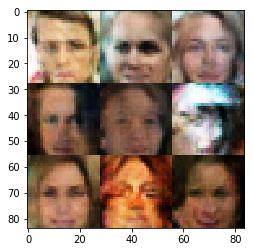

Epoch 1/1... Discriminator Loss: 1.3159... Generator Loss: 0.6773


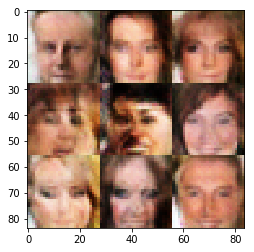

Epoch 1/1... Discriminator Loss: 1.5776... Generator Loss: 0.3742


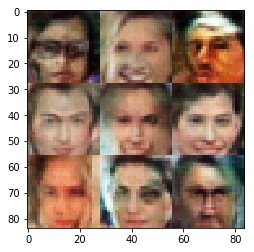

Epoch 1/1... Discriminator Loss: 1.4593... Generator Loss: 0.3756


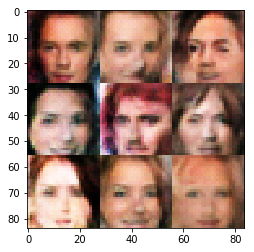

Epoch 1/1... Discriminator Loss: 1.2029... Generator Loss: 0.7070


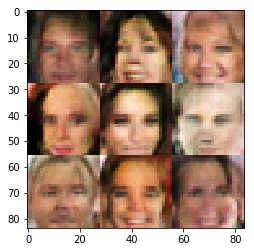

Epoch 1/1... Discriminator Loss: 1.3156... Generator Loss: 0.6400


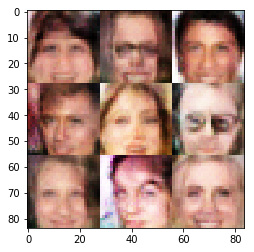

Epoch 1/1... Discriminator Loss: 1.3654... Generator Loss: 0.5996


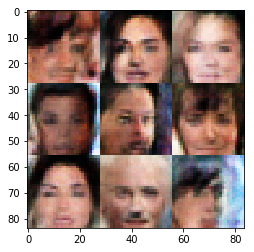

Epoch 1/1... Discriminator Loss: 1.2778... Generator Loss: 0.4171


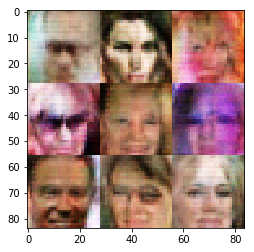

Epoch 1/1... Discriminator Loss: 1.2577... Generator Loss: 1.0566


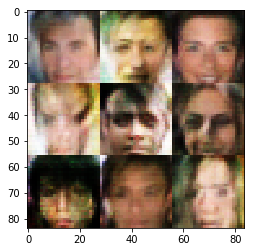

Epoch 1/1... Discriminator Loss: 1.2759... Generator Loss: 0.8088


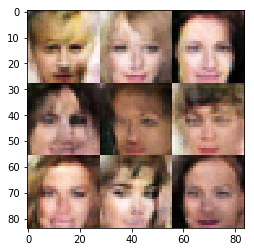

Epoch 1/1... Discriminator Loss: 1.1295... Generator Loss: 0.7491


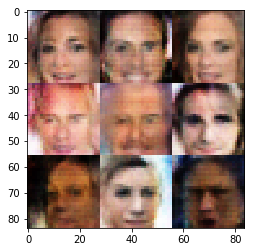

Epoch 1/1... Discriminator Loss: 1.2911... Generator Loss: 0.5112


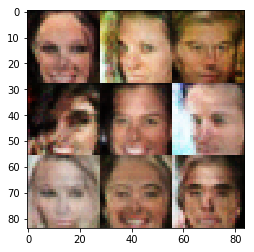

Epoch 1/1... Discriminator Loss: 1.5037... Generator Loss: 0.6477


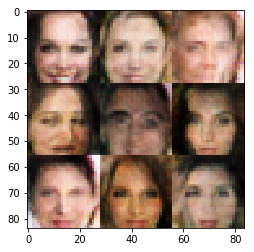

Epoch 1/1... Discriminator Loss: 1.2158... Generator Loss: 0.7321


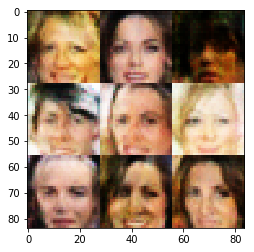

Epoch 1/1... Discriminator Loss: 1.3391... Generator Loss: 0.4868


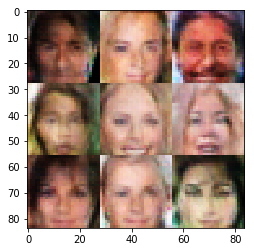

Epoch 1/1... Discriminator Loss: 1.1030... Generator Loss: 1.1386


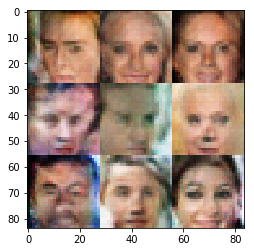

Epoch 1/1... Discriminator Loss: 1.1779... Generator Loss: 0.7631


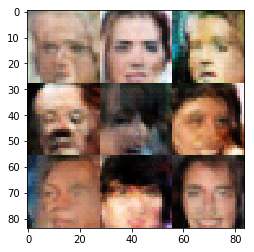

Epoch 1/1... Discriminator Loss: 1.4530... Generator Loss: 0.5553


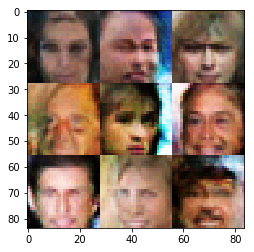

Epoch 1/1... Discriminator Loss: 1.3688... Generator Loss: 1.1746


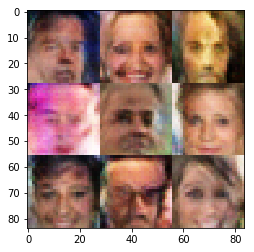

Epoch 1/1... Discriminator Loss: 1.3206... Generator Loss: 0.6375


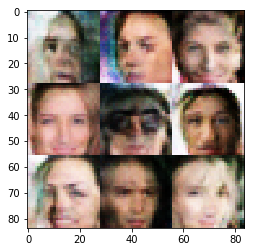

Epoch 1/1... Discriminator Loss: 1.1689... Generator Loss: 1.2088


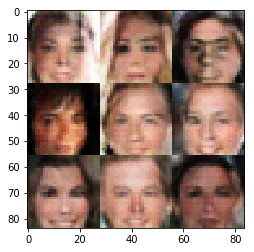

Epoch 1/1... Discriminator Loss: 1.1752... Generator Loss: 0.8790


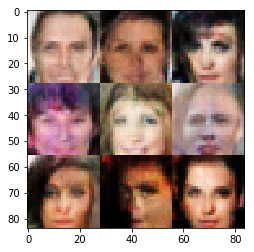

Epoch 1/1... Discriminator Loss: 1.3615... Generator Loss: 0.5801


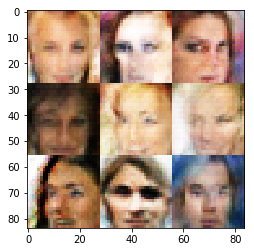

Epoch 1/1... Discriminator Loss: 1.0979... Generator Loss: 0.7185


KeyboardInterrupt: 

In [57]:
batch_size = 50
z_dim = 128
learning_rate = 0.002
beta1 = 0.4


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 1

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)

### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb" and save it as a HTML file under "File" -> "Download as". Include the "helper.py" and "problem_unittests.py" files in your submission.